This is the main analysis on multiple independent variables on years to equate, please scroll down as the first cells are the data processing part. (cell In [17]:)

In [1]:
import pandas as pd
import statsmodels.api as sm
from scipy import stats
import numpy as np
from itertools import chain, combinations
pd.options.display.max_rows = 999
from IPython.display import display
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
from matplotlib import pyplot
import plotly.express as px
from scipy.spatial.distance import cdist
from scipy.stats import ttest_rel
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd


In [2]:
X = pd.read_csv('MERGED2019_20_PP.csv',low_memory=False)
Y = pd.read_csv('results.csv')   # this is same attrition rate for all levels
X_rank = pd.read_csv('qs 2021 score.csv')
female_president = pd.read_csv('female president.csv', encoding= 'unicode_escape')

In [3]:
female_president.head()

,UNITID,Name,women president duration,women president in system,women president 2012-2019,women president before 2012,women president ever
0,200697,Air Force Institute of Technology-Graduate Sch...,0,NaN,0,0,0
1,131159,American University,2017¨Cpresent,NaN,1,0,1
2,104151,Arizona State University Campus Immersion,0,NaN,0,0,0
3,483124,Arizona State University Digital Immersion,0,NaN,0,0,0
4,448886,Arizona State University-Downtown Phoenix,0,NaN,0,0,0


In [4]:
X.head()

,UNITID,OPEID,OPEID6,INSTNM,CITY,STABBR,ZIP,ACCREDAGENCY,INSTURL,NPCURL,...,FEDSCHCD,BOOKSUPPLY,ROOMBOARD_ON,OTHEREXPENSE_ON,ROOMBOARD_OFF,OTHEREXPENSE_OFF,OTHEREXPENSE_FAM,ENDOWBEGIN,ENDOWEND,DOLPROVIDER
0,100654,100200,1002,Alabama A & M University,Normal,AL,35762,Southern Association of Colleges and Schools C...,www.aamu.edu/,www.aamu.edu/admissions-aid/tuition-fees/net-p...,...,1002,1600.0,9240.0,3090.0,9240.0,3090.0,3090.0,NaN,NaN,0
1,100663,105200,1052,University of Alabama at Birmingham,Birmingham,AL,35294-0110,Southern Association of Colleges and Schools C...,https://www.uab.edu/,https://uab.studentaidcalculator.com/survey.aspx,...,1052,1200.0,12307.0,5555.0,12307.0,5555.0,5555.0,524675419.0,537349307.0,0
2,100690,2503400,25034,Amridge University,Montgomery,AL,36117-3553,Southern Association of Colleges and Schools C...,www.amridgeuniversity.edu/,www2.amridgeuniversity.edu:9091/,...,16885,900.0,NaN,NaN,9600.0,1600.0,1600.0,174804.0,174805.0,0
3,100706,105500,1055,University of Alabama in Huntsville,Huntsville,AL,35899,Southern Association of Colleges and Schools C...,www.uah.edu/,finaid.uah.edu/,...,1055,2120.0,10400.0,3994.0,10400.0,3994.0,3994.0,79465021.0,77250279.0,1
4,100724,100500,1005,Alabama State University,Montgomery,AL,36104-0271,Southern Association of Colleges and Schools C...,www.alasu.edu/,www.alasu.edu/cost-aid/tuition-costs/net-price...,...,1005,1600.0,6050.0,3392.0,7320.0,4228.0,4228.0,99638681.0,94536751.0,0


In [5]:
Y.head()

,UNITID,name,promotion rate male1,promotion rate male2,promotion rate female 1,promotion rate female 2,attrition rate male,attrition rate female,100 bottom diff,75 bottom diff,100 all diff,75 all diff,100 bottom same,75 bottom same,100 all same,75 all same
0,100663,University of Alabama at Birmingham,0.093708,0.094170,0.077434,0.089221,0.0420,0.030923,27,35,18,28,26,33,18,27
1,100751,The University of Alabama,0.172851,0.110469,0.146402,0.067289,0.0807,0.086932,21,31,12,22,18,26,10,18
2,100858,Auburn University,0.109109,0.047388,0.107574,0.046019,0.0376,0.034066,34,48,22,37,34,48,22,37
3,104151,Arizona State University Campus Immersion,0.112428,0.074891,0.108205,0.065161,0.0542,0.065202,30,49,16,32,29,47,15,31
4,104179,University of Arizona,0.094280,0.065408,0.087781,0.063505,0.0394,0.024855,27,33,18,28,26,32,18,27


In [6]:
Y['diff 1'] = Y['promotion rate male1']-Y['promotion rate female 1']
Y['diff 2'] = Y['promotion rate male2']-Y['promotion rate female 2']

In [7]:
data_df = pd.merge(Y, X, on='UNITID', how='left')
data_df = pd.merge(data_df,female_president,on='UNITID',how='left')

rank_df = pd.merge(Y, X_rank, on='UNITID', how='left')

In [8]:
rank_df.head()

,UNITID,name,promotion rate male1,promotion rate male2,promotion rate female 1,promotion rate female 2,attrition rate male,attrition rate female,100 bottom diff,75 bottom diff,100 all diff,75 all diff,100 bottom same,75 bottom same,100 all same,75 all same,diff 1,diff 2,Score
0,100663,University of Alabama at Birmingham,0.093708,0.094170,0.077434,0.089221,0.0420,0.030923,27,35,18,28,26,33,18,27,0.016274,0.004948,NaN
1,100751,The University of Alabama,0.172851,0.110469,0.146402,0.067289,0.0807,0.086932,21,31,12,22,18,26,10,18,0.026449,0.043180,NaN
2,100858,Auburn University,0.109109,0.047388,0.107574,0.046019,0.0376,0.034066,34,48,22,37,34,48,22,37,0.001536,0.001369,NaN
3,104151,Arizona State University Campus Immersion,0.112428,0.074891,0.108205,0.065161,0.0542,0.065202,30,49,16,32,29,47,15,31,0.004223,0.009730,42.0
4,104179,University of Arizona,0.094280,0.065408,0.087781,0.063505,0.0394,0.024855,27,33,18,28,26,32,18,27,0.006499,0.001903,36.8


In [9]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 184 entries, 0 to 183
Columns: 2415 entries, UNITID to women president ever
dtypes: float64(2197), int64(26), object(192)
memory usage: 3.4+ MB


In [10]:
data_df.head()

,UNITID,name,promotion rate male1,promotion rate male2,promotion rate female 1,promotion rate female 2,attrition rate male,attrition rate female,100 bottom diff,75 bottom diff,...,OTHEREXPENSE_FAM,ENDOWBEGIN,ENDOWEND,DOLPROVIDER,Name,women president duration,women president in system,women president 2012-2019,women president before 2012,women president ever
0,100663,University of Alabama at Birmingham,0.093708,0.094170,0.077434,0.089221,0.0420,0.030923,27,35,...,5555.0,524675419.0,5.373493e+08,0,University of Alabama at Birmingham,0,NaN,0,0,0
1,100751,The University of Alabama,0.172851,0.110469,0.146402,0.067289,0.0807,0.086932,21,31,...,5860.0,845934399.0,8.328424e+08,1,The University of Alabama,0,NaN,0,0,0
2,100858,Auburn University,0.109109,0.047388,0.107574,0.046019,0.0376,0.034066,34,48,...,5904.0,771403829.0,7.745347e+08,1,Auburn University,0,NaN,0,0,0
3,104151,Arizona State University Campus Immersion,0.112428,0.074891,0.108205,0.065161,0.0542,0.065202,30,49,...,4412.0,569246350.0,7.284614e+08,0,Arizona State University Campus Immersion,0,NaN,0,0,0
4,104179,University of Arizona,0.094280,0.065408,0.087781,0.063505,0.0394,0.024855,27,33,...,3500.0,952914281.0,1.030866e+09,1,University of Arizona,2012-present,NaN,1,0,1


In [11]:
# constructing a set of continuous IVs
IVs2 = data_df[['UNITID','ADM_RATE','UGDS','NPT4_PUB','NPT4_PRIV','C150_4']]

IVs2.NPT4_PUB = IVs2[['NPT4_PUB','NPT4_PRIV']].max(axis=1)

IVs2.drop('NPT4_PRIV', axis=1, inplace=True)


IVs2 = IVs2.dropna()

In [12]:
# constructing a set of IVs without control
IVsig = data_df[['UNITID','CONTROL','CCBASIC','women president 2012-2019','women president before 2012']]


IVsig = IVsig.dropna()


In [13]:
# constructing a set of discrete IVs
IVs = data_df[['UNITID','CONTROL','REGION','LOCALE','CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI','STABBR','women president 2012-2019','women president before 2012']]

IVs = IVs.dropna()

In [14]:
# constructing a set of all IVs
IVsall = data_df[['UNITID','CONTROL','REGION','LOCALE','CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI','ADM_RATE','UGDS','NPT4_PUB','NPT4_PRIV','C150_4','women president 2012-2019','women president before 2012']]

IVsall.NPT4_PUB = IVsall[['NPT4_PUB','NPT4_PRIV']].max(axis=1)

IVsall.drop('NPT4_PRIV', axis=1, inplace=True)


IVsall = IVsall.dropna()

In [15]:
def match_samples(X1, X2, Y1, Y2):
    
    distances = cdist(Y1, Y2, metric='euclidean')
    matches = np.argmin(distances, axis=1)
    return X1, X2.iloc[matches]

def matched_ttest(c1,reg_data,col_name):
    X1 = reg_data.loc[reg_data[col_name]==c1][var_name]
    X2 = reg_data.loc[reg_data[col_name]!=c1][var_name]
    Y1 = reg_data.loc[reg_data[col_name]==c1,reg_data.columns != var_name]
    Y2 = reg_data.loc[reg_data[col_name]!=c1,reg_data.columns != var_name]
    
    matched_X1, matched_X2 = match_samples(X1, X2, Y1, Y2)
    t_stat, p_value = ttest_rel(matched_X1, matched_X2)
    return t_stat, p_value

In [16]:
def ttest_run(c1, c2,reg_data,col_name):
    data1 = reg_data.loc[reg_data[col_name]==c1][var_name]
    data2 = reg_data.loc[reg_data[col_name]==c2][var_name]
    
    results = stats.ttest_ind(data1, data2)
    df = pd.DataFrame({'group by var':col_name,
                       'categ1': c1,
                       'categ2': c2,
                       'tstat': results.statistic,
                       'pvalue': results.pvalue}, 
                       index = [0])    
    return df

In [17]:
def highlight_005(row):

    color = 'white'
    if row.pvalue <= 0.05:
        color = 'red'
    elif row.pvalue<=0.1:
        color = 'yellow'

    return ['background-color: %s' % color]*len(row.values)

In [18]:
def disp_result(var_name):
    DV1 = Y[['UNITID',var_name]]

    indexes = DV1[ (DV1[var_name] == 0) | (DV1[var_name]>1000) ].index

    #indexes = DV1[ (DV1[var_name] == 0)].index

    DV1 = DV1.drop(indexes)
    reg_data = pd.merge(DV1,IVs,on='UNITID',how = 'inner')
    reg_data = reg_data.drop(columns=['UNITID'])
    
    DV1_rank = Y[['UNITID',var_name]]
    
    reg_data_rank = pd.merge(DV1_rank,X_rank,on='UNITID',how = 'inner')
    reg_data_rank = reg_data_rank.drop(columns=['UNITID'])
    
    
    for col in ['CONTROL','REGION',"LOCALE",'CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('int')
    # plot average year to equate by region
    New_england = ['CT','ME','MA','NH','RI','VT'] #1
    Mid_east = ['DE','DC','MD','NJ','NY','PA']    #2
    Great_lakes = ['IL','IN','MI','OH','WI']      #3
    Plains = ['IA','KS','MN','MO','NE','ND','SD'] #4
    Southeast = ['AL','AR','FL','GA','KY','LA','MS','NC','SC','TN','VA','WV'] #5
    Southwest = ['AZ','NM','OK','TX']             #6
    Rocky = ['CO','ID','MT','UT','WY']            #7
    Far_west = ['AK','CA','HI','NV','OR','WA']    #8
    Outlying = ['AS','FM','GU','MH','MP','PR','RW','VI'] #9
    

    Region1 = np.mean(reg_data.loc[reg_data.REGION==1][var_name])
    Region2 = np.mean(reg_data.loc[reg_data.REGION==2][var_name])
    Region3 = np.mean(reg_data.loc[reg_data.REGION==3][var_name])
    Region4 = np.mean(reg_data.loc[reg_data.REGION==4][var_name])
    Region5 = np.mean(reg_data.loc[reg_data.REGION==5][var_name])
    Region6 = np.mean(reg_data.loc[reg_data.REGION==6][var_name])
    Region7 = np.mean(reg_data.loc[reg_data.REGION==7][var_name])
    Region8 = np.mean(reg_data.loc[reg_data.REGION==8][var_name])

    locations = New_england+Mid_east+Great_lakes+Plains+Southeast+Southwest+Rocky+Far_west
    color = [Region1]*len(New_england)+[Region2]*len(Mid_east)+[Region3]*len(Great_lakes)+[Region4]*len(Plains)+[Region5]*len(Southeast)+[Region6]*len(Southwest)+[Region7]*len(Rocky)+[Region8]*len(Far_west)


    fig = px.choropleth(locations=locations, locationmode="USA-states", color=color, scope="usa",color_continuous_scale='Blues',title='Average '+var_name+' by REGION')
    fig.show()
    
    states = []
    colors = []
    for s in locations:
        if np.mean(reg_data.loc[reg_data.STABBR==s][var_name])>0:
            states.append(s)
            colors.append(np.mean(reg_data.loc[reg_data.STABBR==s][var_name]))
            
    fig = px.choropleth(locations=states, locationmode="USA-states", color=colors, scope="usa",color_continuous_scale='Burg',title='Average '+var_name+' by state')
    fig.show()
    
    ttest_0 = stats.ttest_1samp(reg_data[var_name],0).pvalue
    print('p-value for t test against 0:'+str(np.round_(ttest_0,decimals=5)))
    
    reg_data = reg_data.drop(columns=['STABBR'])
    t_stat, p_value = matched_ttest(16,reg_data,'CCBASIC')
    s = 'matched t test p-value on ccbasic:'+str(np.round_(p_value,decimals=5))
    print(s)
    ccbasic_16 = reg_data.loc[reg_data.CCBASIC==16][var_name]
    ccbasic_else = reg_data.loc[reg_data.CCBASIC!=16][var_name]
    s = 't test p-value on ccbasic:'+str(np.round_(stats.ttest_ind(ccbasic_16, ccbasic_else).pvalue,decimals=5))
    n_bins = 15
    

    bins = np.linspace(0, 500, 50)

    pyplot.hist(ccbasic_16,n_bins,alpha=0.5,density=True,label=" R2 schools, average="+str(np.round_(np.mean(ccbasic_16),decimals=3)))
    pyplot.hist(ccbasic_else,n_bins,alpha=0.5,density=True,label="R1 schools, average="+str(np.round_(np.mean(ccbasic_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for R1/R2 schools, '+s)
    pyplot.show()
    
    
    

    control_2 = reg_data.loc[reg_data.CONTROL==2][var_name]
    control_else = reg_data.loc[reg_data.CONTROL!=2][var_name]
    t_stat, p_value = matched_ttest(2,reg_data,'CONTROL')
    s = 'matched t test p-value on control:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test p-value on control:'+str(np.round_(stats.ttest_ind(control_2, control_else).pvalue,decimals=5))
    bins = np.linspace(0, 500, 50)
    
    pyplot.hist(control_2,n_bins,alpha=0.5,density=True,label="private schools, average="+str(np.round_(np.mean(control_2),decimals=3)))
    pyplot.hist(control_else,n_bins,alpha=0.5,density=True,label="public schools, average="+str(np.round_(np.mean(control_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for private/public schools, '+s)
    pyplot.show()
    
    
    
    AANAPII_1 = reg_data.loc[reg_data.AANAPII==1][var_name]
    AANAPII_else = reg_data.loc[reg_data.AANAPII!=1][var_name]
    t_stat, p_value = matched_ttest(1,reg_data,'AANAPII')
    s = 'matched t test p-value on control:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test p-value on AANAPII:'+str(np.round_(stats.ttest_ind(AANAPII_1, AANAPII_else).pvalue,decimals=5))
    pyplot.hist(AANAPII_1,n_bins,alpha=0.5,density=True,label="AANAPII schools, average="+str(np.round_(np.mean(AANAPII_1),decimals=3)))
    pyplot.hist(AANAPII_else,n_bins,alpha=0.5,density=True,label="other schools, average="+str(np.round_(np.mean(AANAPII_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for AANAPII/other schools, '+s)
    pyplot.show()

    HSI_1 = reg_data.loc[reg_data.HSI==1][var_name]
    HSI_else = reg_data.loc[reg_data.HSI!=1][var_name]
    t_stat, p_value = matched_ttest(1,reg_data,'HSI')
    s = 'matched t test p-value on control:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test on HSI:'+str(stats.ttest_ind(HSI_1, HSI_else))
    s = 't test p-value on HSI:'+str(np.round_(stats.ttest_ind(HSI_1, HSI_else).pvalue,decimals=5))
    pyplot.hist(HSI_1,n_bins,alpha=0.5,density=True,label="HSI schools, average="+str(np.round_(np.mean(HSI_1),decimals=3)))
    pyplot.hist(HSI_else,n_bins,alpha=0.5,density=True,label="other schools, average="+str(np.round_(np.mean(HSI_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for HSI/other schools, '+s)
    pyplot.show()
    
    
    women_during = reg_data.loc[reg_data['women president 2012-2019']==1][var_name]
    women_else = reg_data.loc[reg_data['women president 2012-2019']!=1][var_name]
    t_stat, p_value = matched_ttest(1,reg_data,'women president 2012-2019')
    s = 'matched t test p-value on women president 2012-2019:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test p-value on female president during the period:'+str(np.round_(stats.ttest_ind(women_during, women_else).pvalue,decimals=5))
    n_bins = 15
    

    bins = np.linspace(0, 500, 50)

    pyplot.hist(women_during,n_bins,alpha=0.5,density=True,label="female president, average="+str(np.round_(np.mean(women_during),decimals=3)))
    pyplot.hist(women_else,n_bins,alpha=0.5,density=True,label="no female president, average="+str(np.round_(np.mean(women_else),decimals=3)))
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for schools with/out female president, '+s)
    pyplot.show()
    
    women_before = reg_data.loc[reg_data['women president before 2012']==1][var_name]
    women_else = reg_data.loc[reg_data['women president before 2012']!=1][var_name]
    t_stat, p_value = matched_ttest(1,reg_data,'women president before 2012')
    s = 'matched t test p-value on women president before 2012:'+str(np.round_(p_value,decimals=5))
    print(s)
    s = 't test p-value on female president before the period:'+str(np.round_(stats.ttest_ind(women_before, women_else).pvalue,decimals=5))
    n_bins = 15
    

    bins = np.linspace(0, 500, 50)

    pyplot.hist(women_before,n_bins,alpha=0.5,density=True,label="female president, average="+str(np.round_(np.mean(women_before),decimals=3))+' years')
    pyplot.hist(women_else,n_bins,alpha=0.5,density=True,label="no female president, average="+str(np.round_(np.mean(women_else),decimals=3))+' years')
    pyplot.legend(loc='upper right')
    pyplot.xlabel('years')
    pyplot.ylabel('density')
    pyplot.title(var_name+' for schools with/out female president in the past, '+s)
    pyplot.show()
    
    

    col = 'REGION'
    print('one way anova on',col,':',stats.f_oneway(*[list(reg_data[reg_data[col]==name][var_name]) for name in reg_data[col].unique().tolist()]))
    df_list1 = [ttest_run(i, j,reg_data,col) for i, j in combinations(reg_data[col].unique().tolist(), 2)]
    col = 'LOCALE'
    print('one way anova on',col,':',stats.f_oneway(*[list(reg_data[reg_data[col]==name][var_name]) for name in reg_data[col].unique().tolist()]))
    df_list2 = [ttest_run(i, j,reg_data,col) for i, j in combinations(reg_data[col].unique().tolist(), 2)]
    col = 'CCUGPROF'
    print('one way anova on',col,':',stats.f_oneway(*[list(reg_data[reg_data[col]==name][var_name]) for name in reg_data[col].unique().tolist()]))
    df_list3 = [ttest_run(i, j,reg_data,col) for i, j in combinations(reg_data[col].unique().tolist(), 2)]
    col = 'CCSIZSET'
    print('one way anova on',col,':',stats.f_oneway(*[list(reg_data[reg_data[col]==name][var_name]) for name in reg_data[col].unique().tolist()]))
    df_list4 = [ttest_run(i, j,reg_data,col) for i, j in combinations(reg_data[col].unique().tolist(), 2)]

    df_list = df_list1+df_list2+df_list3+df_list4

    t_test_df = pd.concat(df_list, ignore_index = True)

    for col in ['CONTROL','REGION',"LOCALE",'CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('category')
    reg_data = pd.get_dummies(reg_data,drop_first=True)

    rank_constr = sm.add_constant(reg_data_rank.iloc[:,1:])

    mod_rank = sm.OLS(reg_data_rank.iloc[:,0], rank_constr)

    res_rank = mod_rank.fit()

    print('******** regression solely on rank ********\n')
    print(res_rank.summary())

#     mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

#     res = mod.fit()

#     print(res.summary())
    
    
#     DV2 = Y[['UNITID',var_name]]

#     indexes = DV2[ (DV2[var_name] == 0) | (DV2[var_name]>1000) ].index
#     DV2 = DV2.drop(indexes)
#     reg_data = pd.merge(DV2,IVs2,on='UNITID',how = 'inner')
#     reg_data = reg_data.drop(columns=['UNITID'])
#     mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

#     res = mod.fit()

#     print(res.summary())
    
    DVall = Y[['UNITID',var_name]]

    indexes = DVall[ (DVall[var_name] == 0) | (DVall[var_name]>1000) ].index
    DVall = DVall.drop(indexes)
    reg_data = pd.merge(DVall,IVsall,on='UNITID',how = 'inner')
    reg_data = reg_data.drop(columns=['UNITID'])
    reg_data = reg_data.drop(columns=['LOCALE'])
    for col in ['CONTROL','REGION','CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('int')
    for col in ['CONTROL','REGION','CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('category')
    reg_data = pd.get_dummies(reg_data,drop_first=True)
    reg_data['CCBASIC_15'] = 1-reg_data['CCBASIC_16']
    reg_data = reg_data.drop(columns=['CCBASIC_16'])
    reg_data = reg_data.rename(columns={"CONTROL_2": "Private School Indicator", "CCBASIC_15": "R1 School Indicator"})
    mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

    res = mod.fit()
    print('\n ******** regression on all variables and all controls, no interaction ******** \n')
    print(res.summary())
    
    DVall = Y[['UNITID',var_name]]

    indexes = DVall[ (DVall[var_name] == 0) | (DVall[var_name]>1000) ].index
    DVall = DVall.drop(indexes)
    reg_data = pd.merge(DVall,IVsall,on='UNITID',how = 'inner')
    reg_data = reg_data.drop(columns=['UNITID'])
    reg_data = reg_data.drop(columns=['LOCALE'])
    for col in ['CONTROL','REGION','CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('int')
    for col in ['CONTROL','REGION','CCBASIC','CCUGPROF','CCSIZSET','AANAPII','HSI']:
        reg_data[col] = reg_data[col].astype('category')
    control_dummies = pd.get_dummies(reg_data['CONTROL'], prefix='CONTROL')
    ccbasic_dummies = pd.get_dummies(reg_data['CCBASIC'], prefix='CCBASIC')
    #women_dummies = pd.get_dummies(reg_data['women president 2012-2019'], prefix='women_president_now')
    #women_ever_dummies = pd.get_dummies(reg_data['women president before 2012'], prefix='women_president_ever')

    reg_data = pd.concat([reg_data, control_dummies, ccbasic_dummies], axis=1)
    reg_data = reg_data.drop('CONTROL', axis=1)
    reg_data = reg_data.drop('CCBASIC', axis=1)
    #reg_data = reg_data.drop('women president 2012-2019', axis=1)
    #reg_data = reg_data.drop('women president before 2012', axis=1)

    reg_data = pd.get_dummies(reg_data,drop_first=True)
    reg_data['R1_women_president_now'] = reg_data['CCBASIC_15'] * reg_data['women president 2012-2019']
    reg_data['R1_women_president_ever'] = reg_data['CCBASIC_15'] * reg_data['women president before 2012']
    reg_data['R1_private'] = reg_data['CCBASIC_15'] * reg_data['CONTROL_2']
    
    #reg_data = reg_data.drop('CONTROL_1', axis=1)
    reg_data = reg_data.drop('CONTROL_1', axis=1)
    #reg_data = reg_data.drop('CCBASIC_15', axis=1)
    reg_data = reg_data.drop('CCBASIC_16', axis=1)
    reg_data = reg_data.rename(columns={"CONTROL_2": "Private School Indicator", "CCBASIC_15": "R1 School Indicator"})
    mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

    res = mod.fit()
    print('******** regression on all variables and all controls, with interaction of R1 with private and R1 with women president ********\n')
    print(res.summary())
    
    DVsig = Y[['UNITID',var_name]]

    indexes = DVsig[ (DVsig[var_name] == 0) | (DVsig[var_name]>1000) ].index
    DVsig = DVsig.drop(indexes)
    reg_data = pd.merge(DVsig,IVsig,on='UNITID',how = 'inner')
    reg_data = reg_data.drop(columns=['UNITID'])
    for col in ['CONTROL','CCBASIC']:
        reg_data[col] = reg_data[col].astype('int')
    for col in ['CONTROL','CCBASIC']:
        reg_data[col] = reg_data[col].astype('category')
        
    reg_data = pd.get_dummies(reg_data)
    reg_data = reg_data.drop('CONTROL_1', axis=1)
    reg_data = reg_data.drop('CCBASIC_16', axis=1)
    reg_data = reg_data.rename(columns={"CONTROL_2": "Private School Indicator", "CCBASIC_15": "R1 School Indicator"})
    mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

    res = mod.fit()
    print('******** regression on all variables and no controls, no interaction ********\n')
    print(res.summary())
    
    
#     DVsig = Y[['UNITID',var_name]]

#     indexes = DVsig[ (DVsig[var_name] == 0) | (DVsig[var_name]>1000) ].index
#     DVsig = DVsig.drop(indexes)
#     reg_data = pd.merge(DVsig,IVsig,on='UNITID',how = 'inner')
#     reg_data = reg_data.drop(columns=['UNITID'])
#     for col in ['CONTROL','CCBASIC']:
#         reg_data[col] = reg_data[col].astype('int')
#     for col in ['CONTROL','CCBASIC']:
#         reg_data[col] = reg_data[col].astype('category')
#     control_dummies = pd.get_dummies(reg_data['CONTROL'], prefix='CONTROL')
#     ccbasic_dummies = pd.get_dummies(reg_data['CCBASIC'], prefix='CCBASIC')

#     reg_data = pd.concat([reg_data, control_dummies, ccbasic_dummies], axis=1)
#     reg_data = reg_data.drop('CONTROL', axis=1)
#     reg_data = reg_data.drop('CCBASIC', axis=1)

#     for col_control in control_dummies.columns:
#         for col_ccbasic in ccbasic_dummies.columns:
#             interaction_col_name = col_control + '_' + col_ccbasic
#             reg_data[interaction_col_name] = reg_data[col_control] * reg_data[col_ccbasic]

#     reg_data = pd.get_dummies(reg_data,drop_first=True)
#     #reg_data = reg_data.drop('CONTROL_1', axis=1)
#     reg_data = reg_data.drop('CONTROL_2', axis=1)
#     reg_data = reg_data.drop('CCBASIC_15', axis=1)
#     reg_data = reg_data.drop('CCBASIC_16', axis=1)
#     reg_data = reg_data.drop('CONTROL_1_CCBASIC_15', axis=1)
#     mod = sm.OLS(reg_data.iloc[:,0], sm.add_constant(reg_data.iloc[:,1:]))

#     res = mod.fit()
#     print(res.summary())
    
    reg_data = pd.merge(DVsig,IVsig,on='UNITID',how = 'inner')
    data = pd.DataFrame({
        'dv': reg_data[var_name].values,  
        'v1': reg_data['CONTROL'].values,  
        'v2': reg_data['CCBASIC'].values   
    })


    data['group'] = data['v1'].astype(str) + '-' + data['v2'].astype(str)


    model = ols('dv ~ group', data=data).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)

    print(anova_table)
    posthoc = pairwise_tukeyhsd(endog=data['dv'], groups=data['group'], alpha=0.05)
    print(posthoc)
    
    
    display(t_test_df.style.apply(highlight_005, axis=1))
    return 

In the following cells, the reults are listed as follows:
1. Each cell represents one time to equate based on different settings: 75% or 100% of women hired/hired from bottom or all levels, and how we mesuare time to equate: women is equally represented on all levels/only full professor level (level 3)/only associate professor level (level 2), and only assistant prof level (level 1). For example, variable name '75 women all 3' is the time to equate when we hire 75% women, from all levels, and measure the time to equate on full professor level only. 
2. First, the average years to equate by region/state is displayed.
3. Second, a set of histogram side by side is displayed, it shows the t-test and distribution of year to equate, grouped by the binary independent variables: CONTROL, CCBASIC, AANAPI, HSI.
4. Third, it shows the ANOVA for categorical variables with multiple categories.
5. Fourth, it shows a regression of all categorical variables, all numerical variables and all variables.
6. Finally, it shows a pairwise t-test for all categories of all the multi-category independent variables, the significant pairs are highlighted by yellow (p<0.1) and red (p<0.05)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.01613


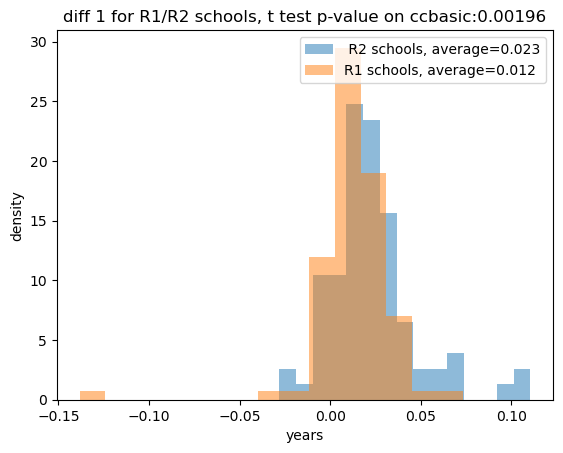

matched t test p-value on control:0.03525


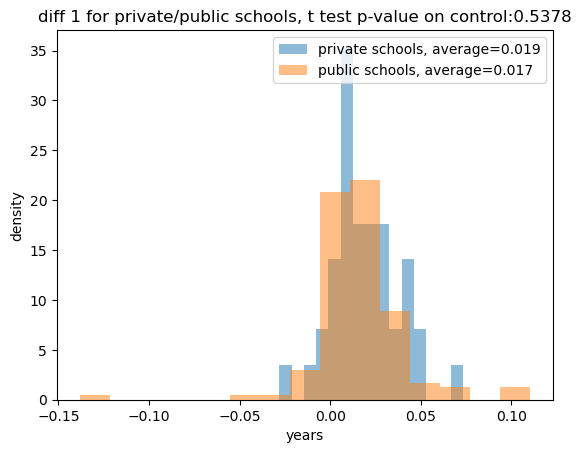

matched t test p-value on control:0.59091


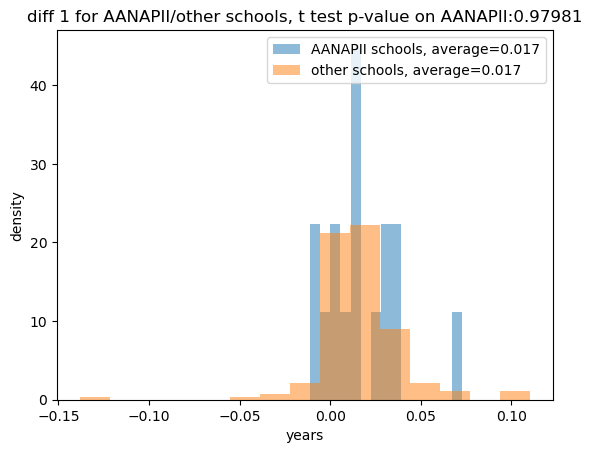

matched t test p-value on control:0.40964


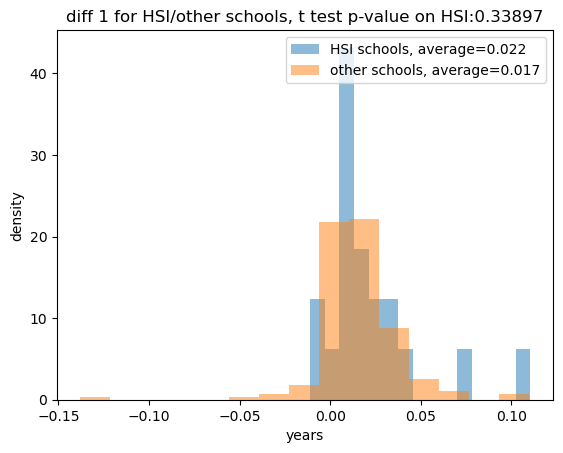

matched t test p-value on women president 2012-2019:0.30291


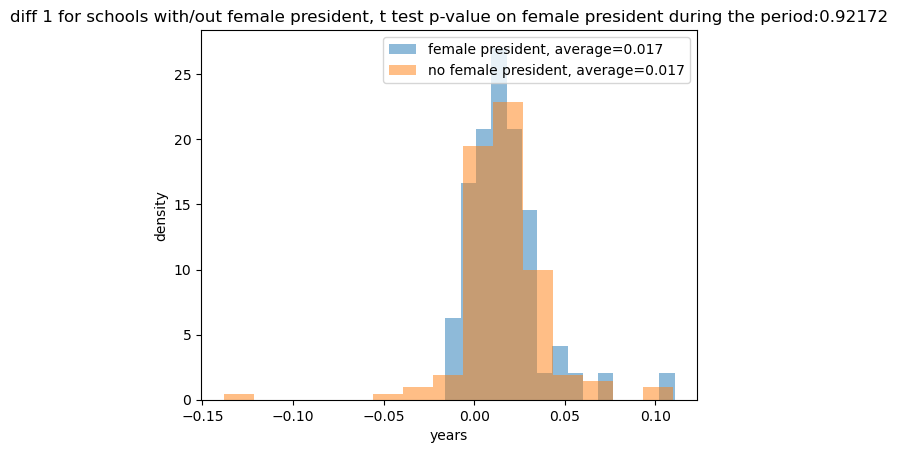

matched t test p-value on women president before 2012:0.37034


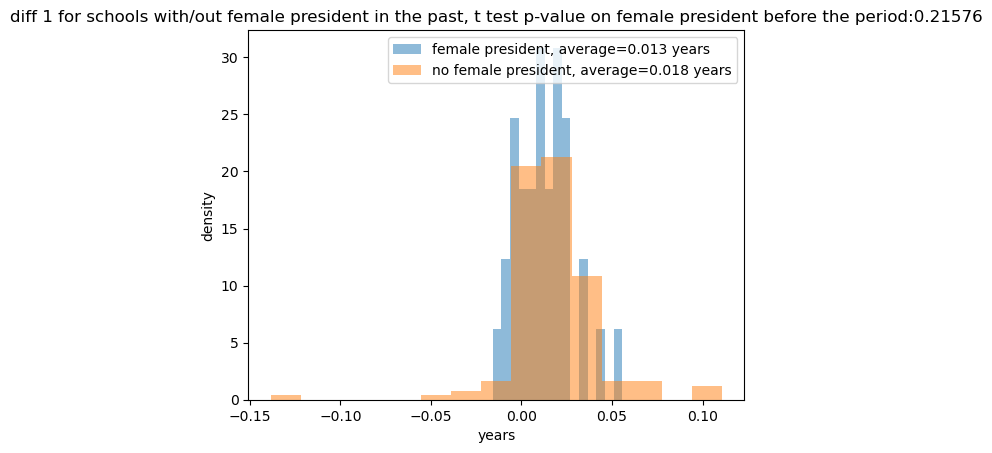

one way anova on REGION : F_onewayResult(statistic=1.5952345096380722, pvalue=0.13953517495944642)
one way anova on LOCALE : F_onewayResult(statistic=0.6167640089351717, pvalue=0.7630485992040326)
one way anova on CCUGPROF : F_onewayResult(statistic=5.968371098084176, pvalue=2.870017712498286e-07)
one way anova on CCSIZSET : F_onewayResult(statistic=0.6181614796109166, pvalue=0.7155975586658072)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:                 diff 1   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.4977
Date:                Thu, 02 Nov 2023   Prob (F-statistic):              0.483
Time:                        16:03:42   Log-Likelihood:                 185.86
No. Observations:                  66   AIC:                            -367.7
Df 

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
1-15.0 1-16.0    0.013 0.0053   0.003 0.0231   True
1-15.0 2-15.0   0.0069 0.6222 -0.0079 0.0217  False
1-15.0 2-16.0   0.0093 0.3364  -0.005 0.0235  False
1-16.0 2-15.0  -0.0061 0.7286 -0.0214 0.0092  False
1-16.0 2-16.0  -0.0038 0.9115 -0.0185  0.011  False
2-15.0 2-16.0   0.0023 0.9874  -0.016 0.0207  False
---------------------------------------------------


,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-1.550175,0.126273
1,REGION,5,8,0.679495,0.499313
2,REGION,5,7,-0.225901,0.822147
3,REGION,5,2,-0.322356,0.748080
4,REGION,5,3,2.476506,0.015652
5,REGION,5,4,-0.268934,0.788935
6,REGION,5,1,1.960528,0.055199
7,REGION,6,8,1.553970,0.128482
8,REGION,6,7,0.832994,0.411898
9,REGION,6,2,0.741263,0.462002


In [19]:
var_name = 'diff 1'
disp_result(var_name)

p-value for t test against 0:1e-05
matched t test p-value on ccbasic:0.68456


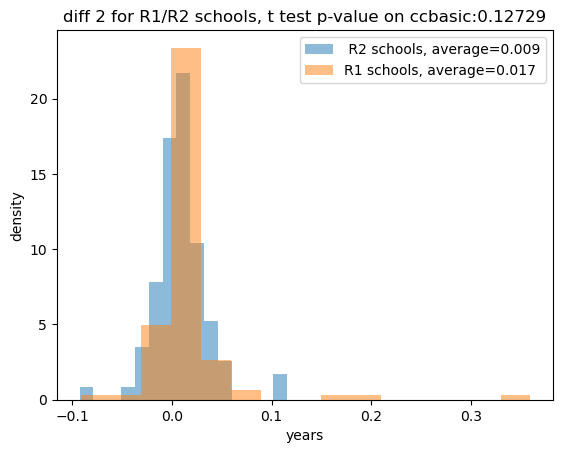

matched t test p-value on control:0.79208


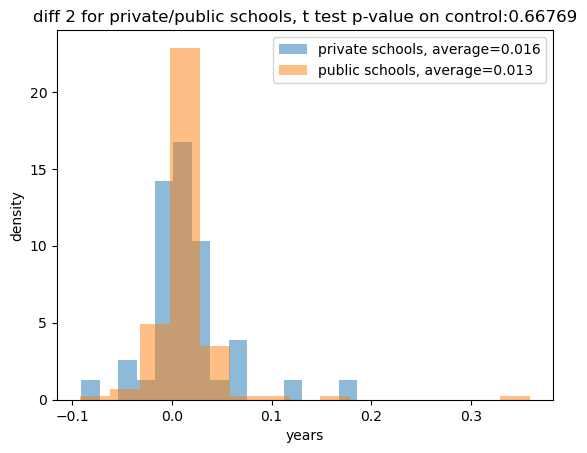

matched t test p-value on control:0.56722


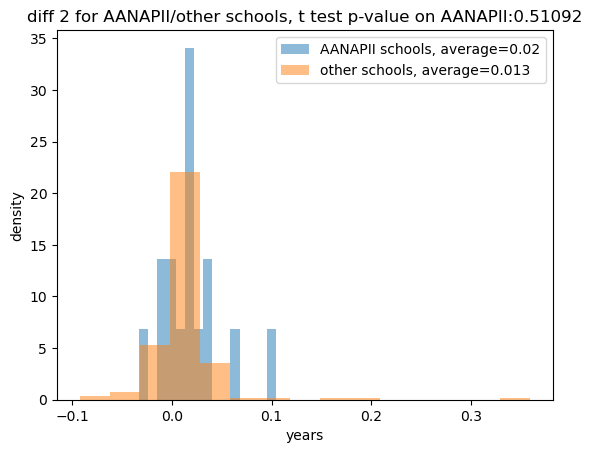

matched t test p-value on control:0.39348


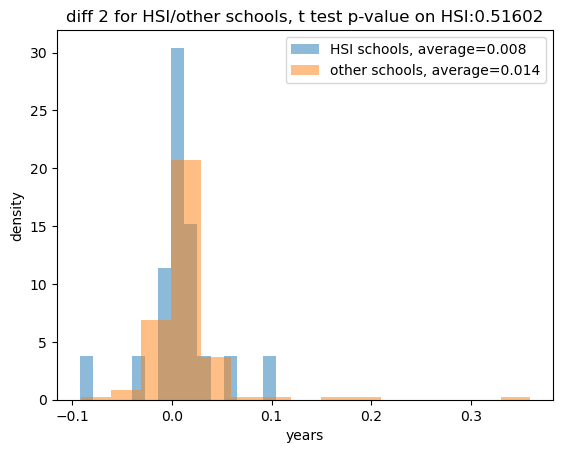

matched t test p-value on women president 2012-2019:0.34339


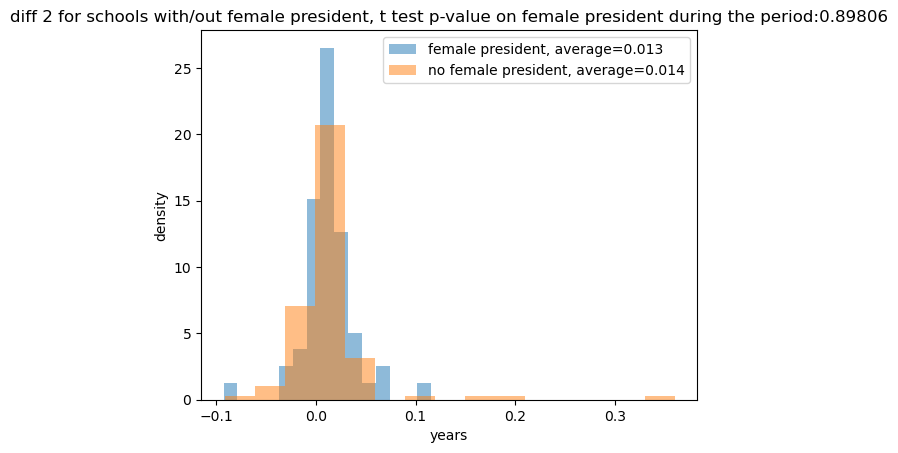

matched t test p-value on women president before 2012:0.35725


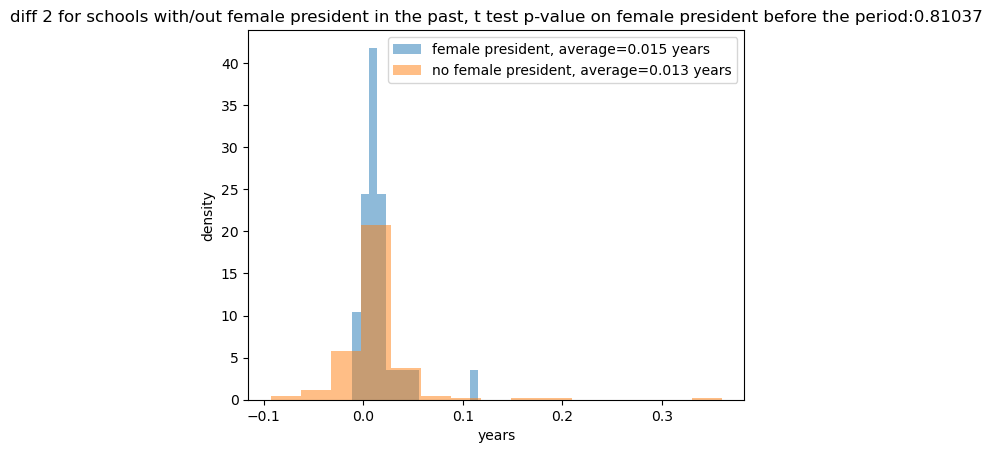

one way anova on REGION : F_onewayResult(statistic=0.9736237486915577, pvalue=0.4520327689401519)
one way anova on LOCALE : F_onewayResult(statistic=1.515370695009965, pvalue=0.15479197552567778)
one way anova on CCUGPROF : F_onewayResult(statistic=6.835146512829102, pvalue=2.151221704175135e-08)
one way anova on CCSIZSET : F_onewayResult(statistic=4.224303351006546, pvalue=0.0005331362661042438)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:                 diff 2   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.043
Method:                 Least Squares   F-statistic:                     3.945
Date:                Thu, 02 Nov 2023   Prob (F-statistic):             0.0513
Time:                        16:03:43   Log-Likelihood:                 138.20
No. Observations:                  66   AIC:                            -272.4
Df

            sum_sq     df        F    PR(>F)
group     0.005763    3.0  1.26519  0.287807
Residual  0.273292  180.0      NaN       NaN
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
1-15.0 1-16.0  -0.0125 0.2356 -0.0296 0.0046  False
1-15.0 2-15.0  -0.0036  0.983 -0.0288 0.0217  False
1-15.0 2-16.0  -0.0014 0.9989 -0.0256 0.0229  False
1-16.0 2-15.0   0.0089  0.811 -0.0171  0.035  False
1-16.0 2-16.0   0.0111 0.6594  -0.014 0.0363  False
2-15.0 2-16.0   0.0022 0.9978  -0.029 0.0334  False
---------------------------------------------------


,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,1.029615,0.307256
1,REGION,5,8,-2.695666,0.008997
2,REGION,5,7,1.401878,0.166781
3,REGION,5,2,-0.854609,0.395489
4,REGION,5,3,-0.451909,0.652712
5,REGION,5,4,-0.212855,0.832186
6,REGION,5,1,2.592408,0.012290
7,REGION,6,8,-2.239153,0.031079
8,REGION,6,7,0.232797,0.817612
9,REGION,6,2,-0.854806,0.396736


In [20]:
var_name = 'diff 2'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.0


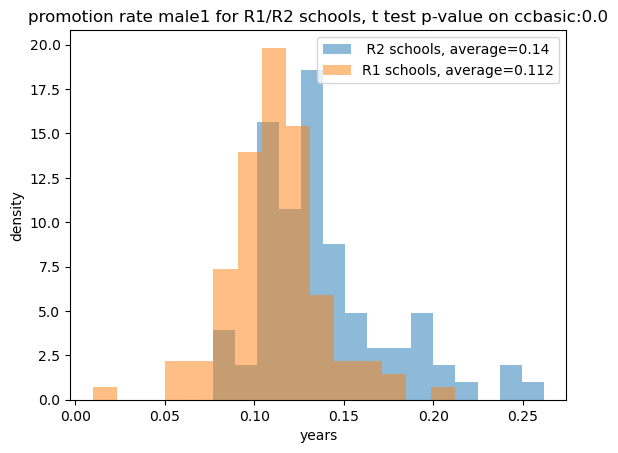

matched t test p-value on control:0.0466


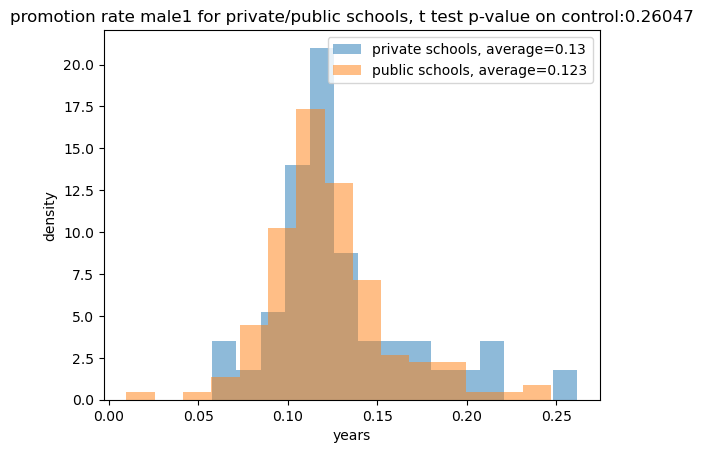

matched t test p-value on control:0.1288


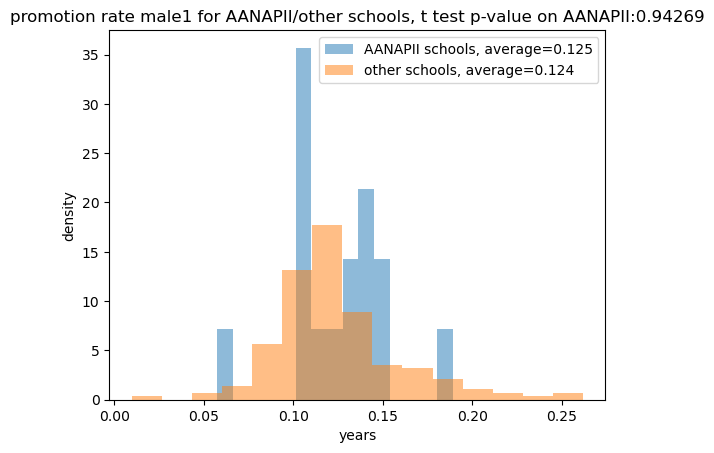

matched t test p-value on control:0.36117


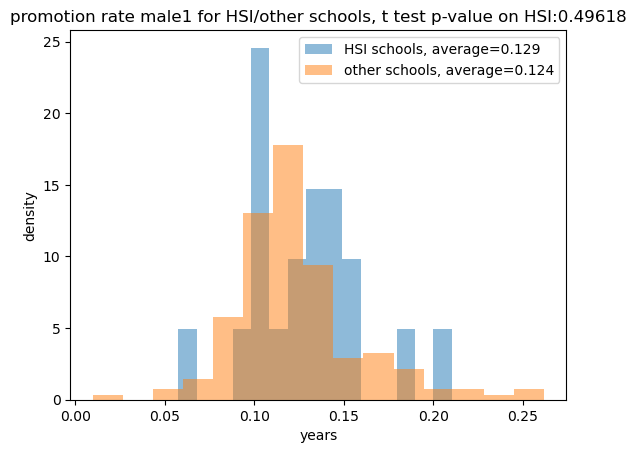

matched t test p-value on women president 2012-2019:0.02111


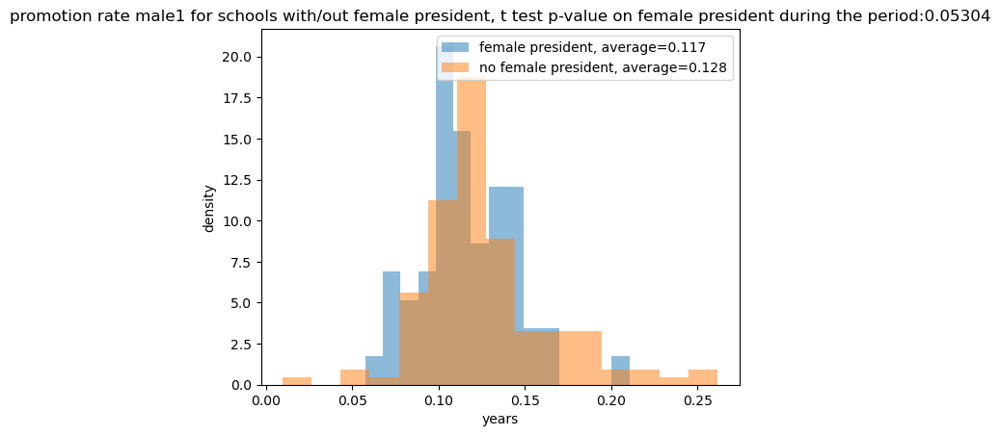

matched t test p-value on women president before 2012:0.43136


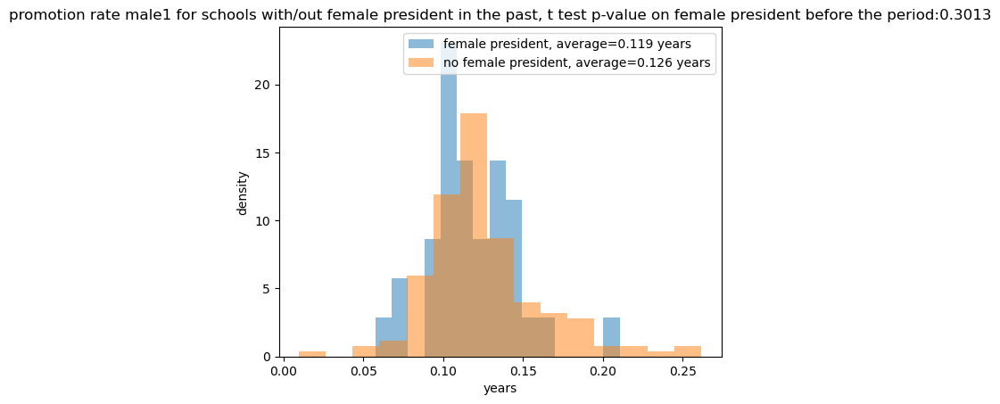

one way anova on REGION : F_onewayResult(statistic=1.454312404892947, pvalue=0.18654387554293375)
one way anova on LOCALE : F_onewayResult(statistic=0.22605477020696013, pvalue=0.9857916431649202)
one way anova on CCUGPROF : F_onewayResult(statistic=6.30317916992788, pvalue=1.049673839984395e-07)
one way anova on CCSIZSET : F_onewayResult(statistic=3.0740280334708774, pvalue=0.006913110676677453)
******** regression solely on rank ********

                             OLS Regression Results                             
Dep. Variable:     promotion rate male1   R-squared:                       0.000
Model:                              OLS   Adj. R-squared:                 -0.016
Method:                   Least Squares   F-statistic:                  0.005775
Date:                  Thu, 02 Nov 2023   Prob (F-statistic):              0.940
Time:                          16:03:44   Log-Likelihood:                 147.91
No. Observations:                    66   AIC:                       

******** regression on all variables and no controls, no interaction ********

                             OLS Regression Results                             
Dep. Variable:     promotion rate male1   R-squared:                       0.166
Model:                              OLS   Adj. R-squared:                  0.147
Method:                   Least Squares   F-statistic:                     8.890
Date:                  Thu, 02 Nov 2023   Prob (F-statistic):           1.43e-06
Time:                          16:03:44   Log-Likelihood:                 371.78
No. Observations:                   184   AIC:                            -733.6
Df Residuals:                       179   BIC:                            -717.5
Df Model:                             4                                         
Covariance Type:              nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
---------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-0.060582,0.951890
1,REGION,5,8,0.586863,0.559393
2,REGION,5,7,1.302297,0.198446
3,REGION,5,2,-0.575505,0.566672
4,REGION,5,3,2.353170,0.021388
5,REGION,5,4,0.940517,0.350853
6,REGION,5,1,1.288069,0.203317
7,REGION,6,8,0.540083,0.592291
8,REGION,6,7,1.163188,0.254571
9,REGION,6,2,-0.382972,0.703364


In [21]:
var_name = 'promotion rate male1'
disp_result(var_name)
# cost is significant? # show in a map

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.24213


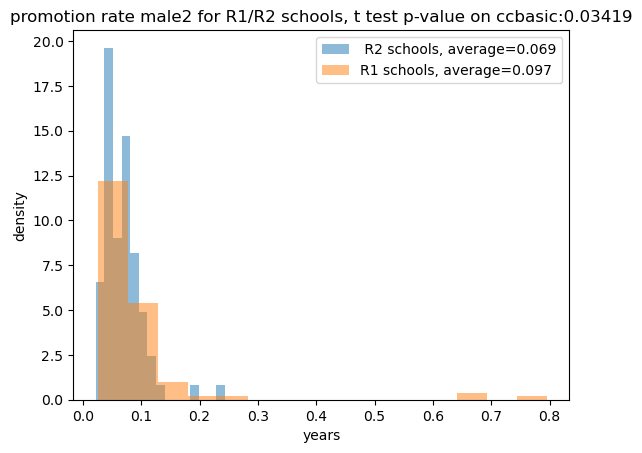

matched t test p-value on control:0.22968


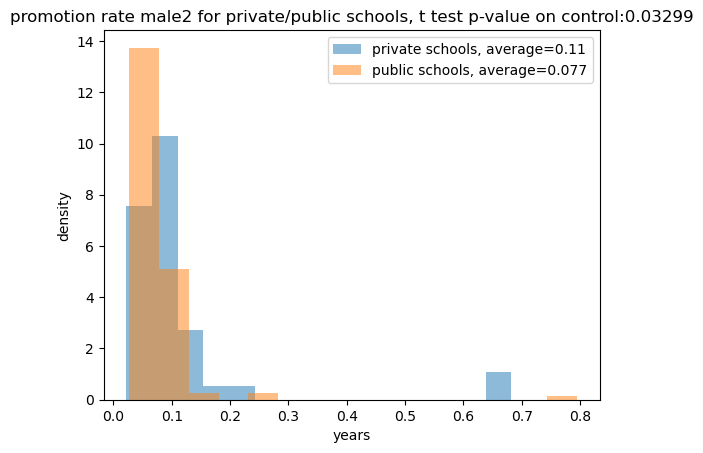

matched t test p-value on control:0.05378


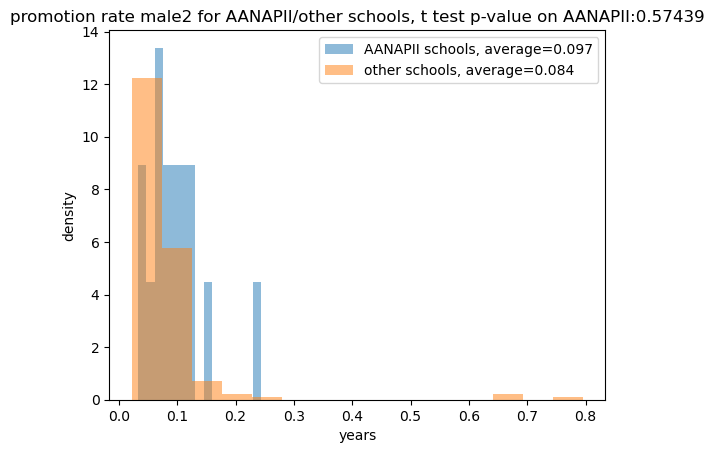

matched t test p-value on control:0.07594


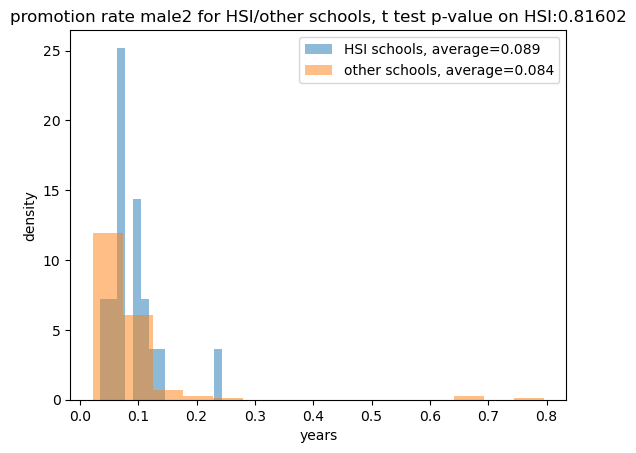

matched t test p-value on women president 2012-2019:0.72257


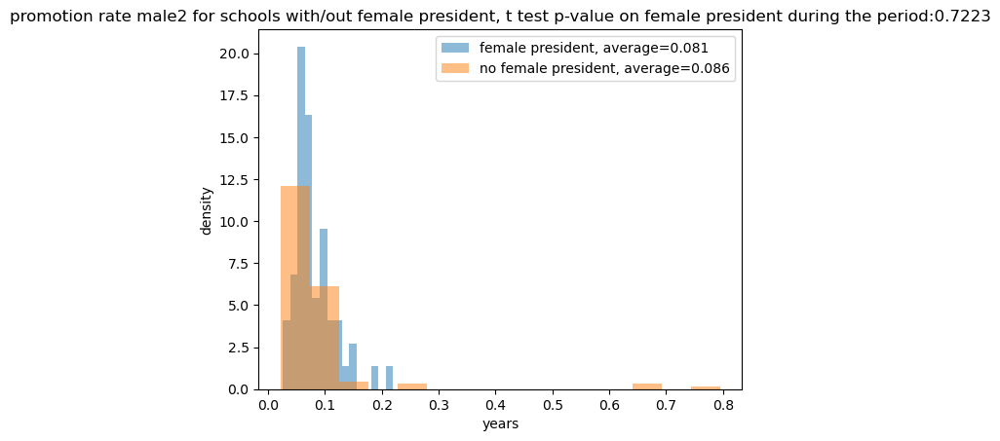

matched t test p-value on women president before 2012:0.5504


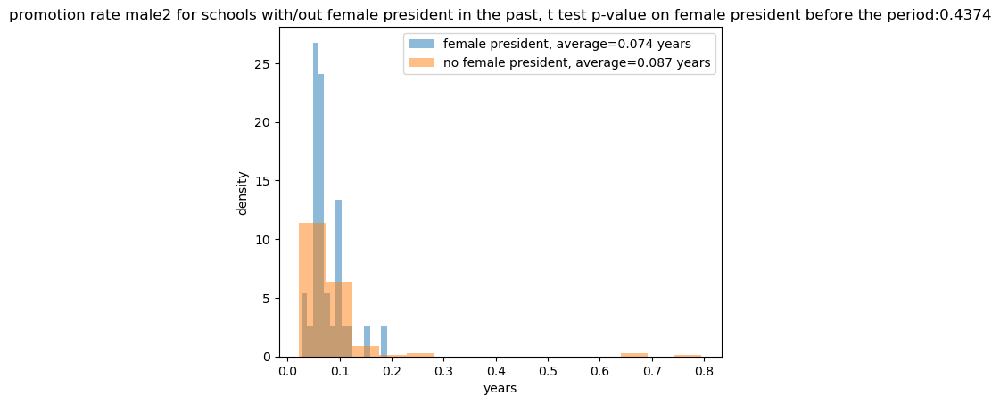

one way anova on REGION : F_onewayResult(statistic=1.7921258789020285, pvalue=0.09146517202693644)
one way anova on LOCALE : F_onewayResult(statistic=1.2513997443681184, pvalue=0.27206820527773434)
one way anova on CCUGPROF : F_onewayResult(statistic=4.23124282059817, pvalue=5.687011370179927e-05)
one way anova on CCSIZSET : F_onewayResult(statistic=2.197499846110545, pvalue=0.04532523493685231)
******** regression solely on rank ********

                             OLS Regression Results                             
Dep. Variable:     promotion rate male2   R-squared:                       0.207
Model:                              OLS   Adj. R-squared:                  0.195
Method:                   Least Squares   F-statistic:                     16.70
Date:                  Thu, 02 Nov 2023   Prob (F-statistic):           0.000125
Time:                          16:03:44   Log-Likelihood:                 61.483
No. Observations:                    66   AIC:                        

******** regression on all variables and no controls, no interaction ********

                             OLS Regression Results                             
Dep. Variable:     promotion rate male2   R-squared:                       0.056
Model:                              OLS   Adj. R-squared:                  0.035
Method:                   Least Squares   F-statistic:                     2.663
Date:                  Thu, 02 Nov 2023   Prob (F-statistic):             0.0341
Time:                          16:03:44   Log-Likelihood:                 190.18
No. Observations:                   184   AIC:                            -370.4
Df Residuals:                       179   BIC:                            -354.3
Df Model:                             4                                         
Covariance Type:              nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
---------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.254394,0.027774
1,REGION,5,8,-3.888123,0.000246
2,REGION,5,7,-1.305606,0.197326
3,REGION,5,2,-2.071522,0.041749
4,REGION,5,3,-0.669607,0.505280
5,REGION,5,4,0.382323,0.703619
6,REGION,5,1,1.288290,0.203241
7,REGION,6,8,-1.525543,0.135404
8,REGION,6,7,0.387957,0.700982
9,REGION,6,2,-1.089141,0.281314


In [22]:
var_name = 'promotion rate male2'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.00011


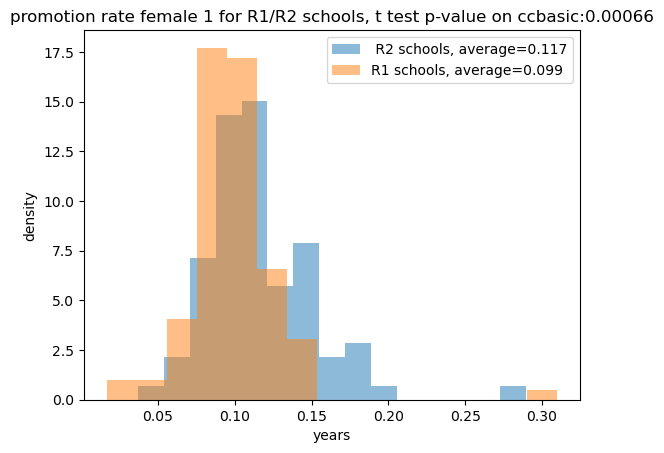

matched t test p-value on control:0.23992


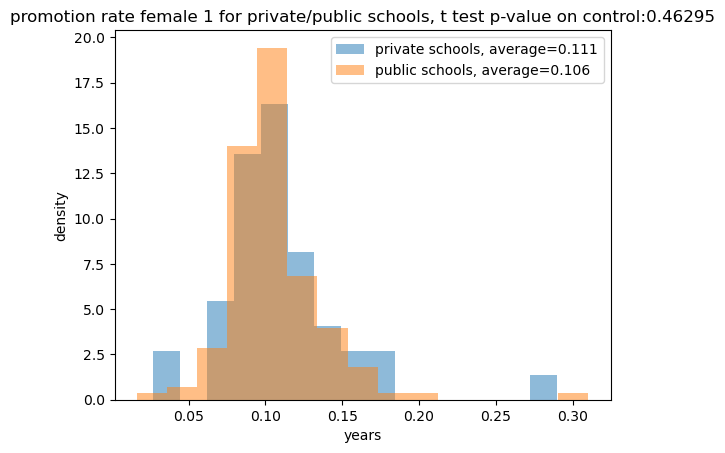

matched t test p-value on control:0.09163


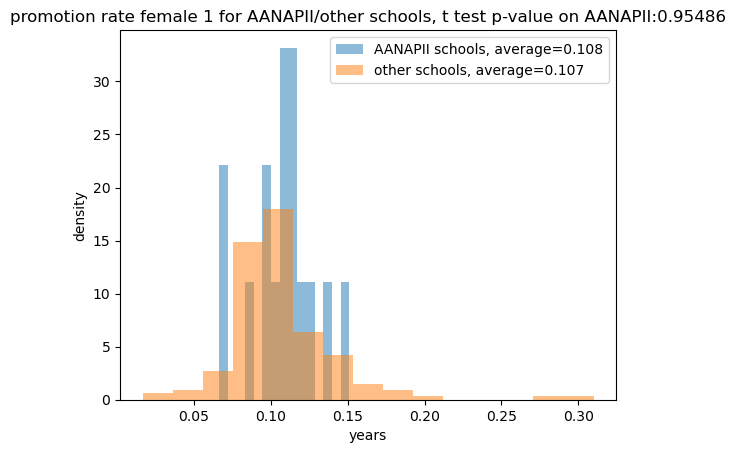

matched t test p-value on control:0.69518


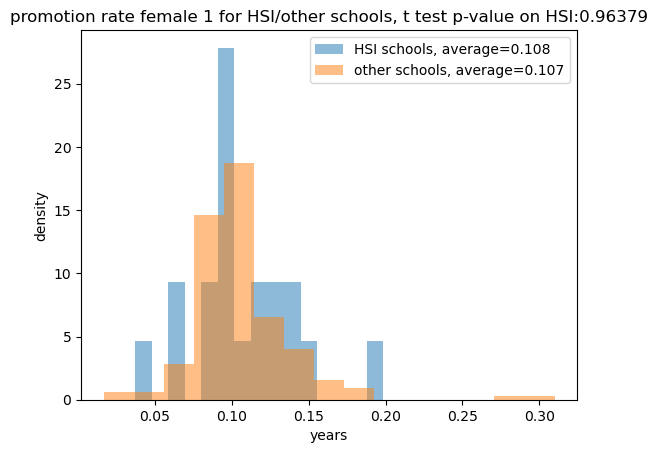

matched t test p-value on women president 2012-2019:0.04465


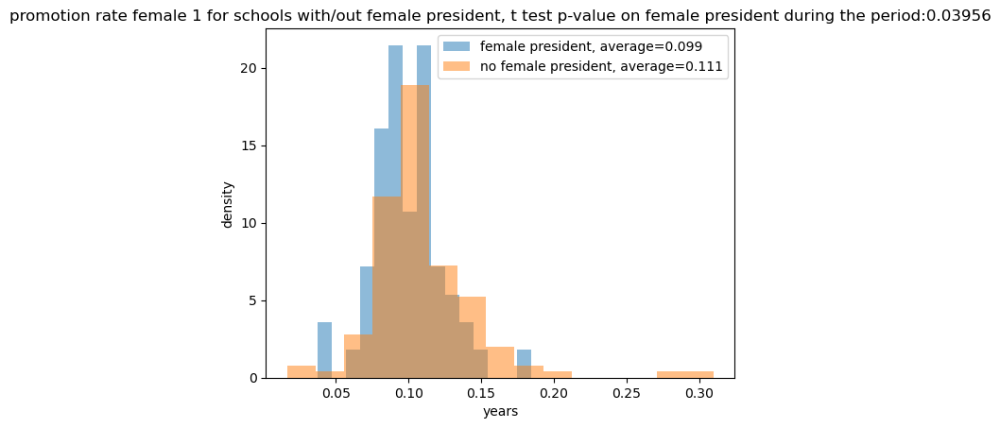

matched t test p-value on women president before 2012:0.15399


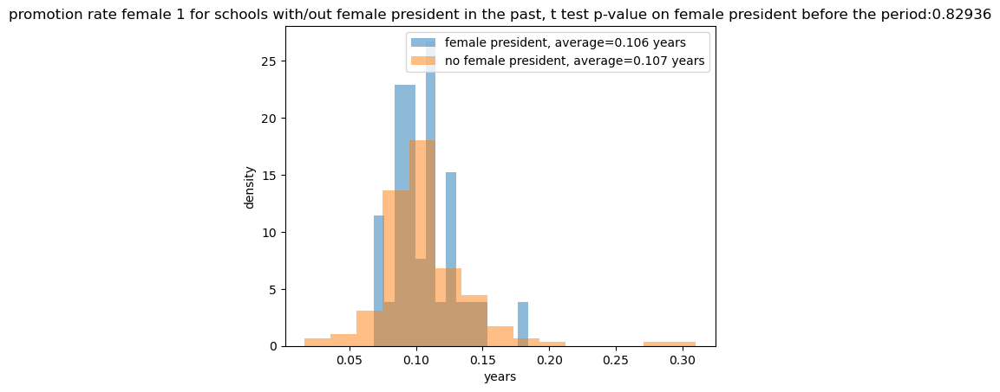

one way anova on REGION : F_onewayResult(statistic=0.686069373623371, pvalue=0.6837458871390286)
one way anova on LOCALE : F_onewayResult(statistic=0.23784126853037427, pvalue=0.9832333262737829)
one way anova on CCUGPROF : F_onewayResult(statistic=7.145382736670879, pvalue=8.604549402475527e-09)
one way anova on CCSIZSET : F_onewayResult(statistic=2.0191140678881685, pvalue=0.06541704578860875)
******** regression solely on rank ********

                               OLS Regression Results                              
Dep. Variable:     promotion rate female 1   R-squared:                       0.005
Model:                                 OLS   Adj. R-squared:                 -0.011
Method:                      Least Squares   F-statistic:                    0.3021
Date:                     Thu, 02 Nov 2023   Prob (F-statistic):              0.584
Time:                             16:03:45   Log-Likelihood:                 157.83
No. Observations:                       66   AIC:   

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
1-15.0 1-16.0   0.0143 0.0595 -0.0004 0.0289  False
1-15.0 2-15.0  -0.0028 0.9863 -0.0244 0.0187  False
1-15.0 2-16.0   0.0227 0.0259   0.002 0.0435   True
1-16.0 2-15.0  -0.0171  0.195 -0.0394 0.0052  False
1-16.0 2-16.0   0.0085 0.7369  -0.013   0.03  False
2-15.0 2-16.0   0.0256 0.0659 -0.0011 0.0523  False
---------------------------------------------------


,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,1.049063,0.298288
1,REGION,5,8,0.225976,0.821952
2,REGION,5,7,1.360515,0.179425
3,REGION,5,2,-0.313273,0.754943
4,REGION,5,3,1.160998,0.249531
5,REGION,5,4,1.136259,0.260521
6,REGION,5,1,0.206203,0.837423
7,REGION,6,8,-0.817549,0.418711
8,REGION,6,7,0.604786,0.550191
9,REGION,6,2,-0.968918,0.337250


In [23]:
var_name = 'promotion rate female 1'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.22483


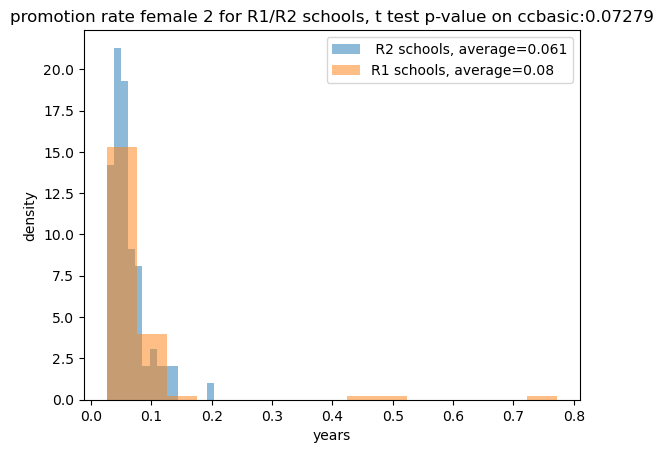

matched t test p-value on control:0.14988


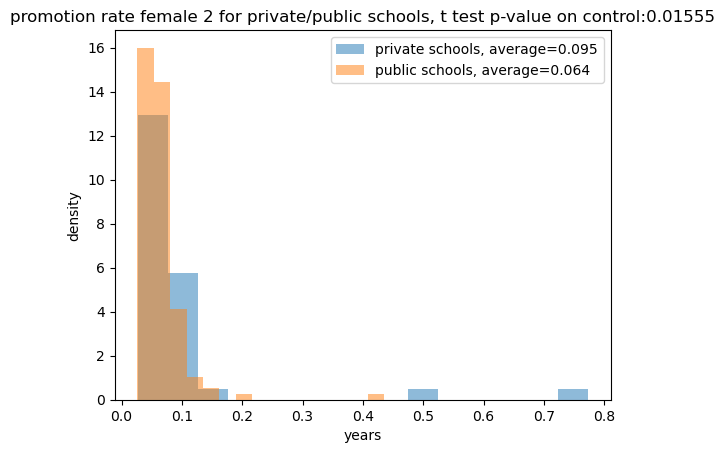

matched t test p-value on control:0.02422


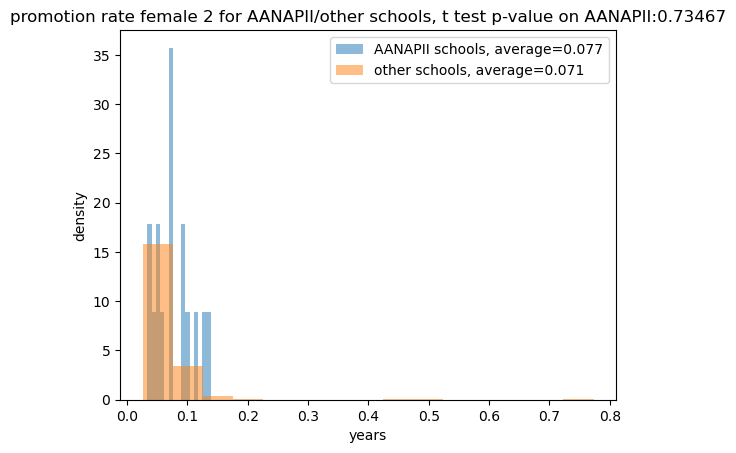

matched t test p-value on control:0.01639


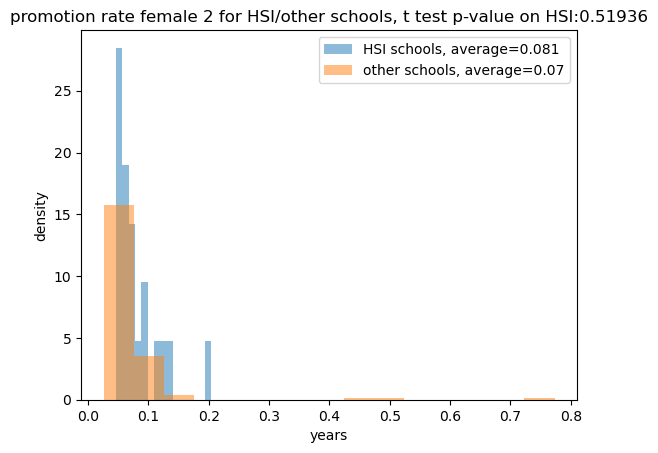

matched t test p-value on women president 2012-2019:0.07935


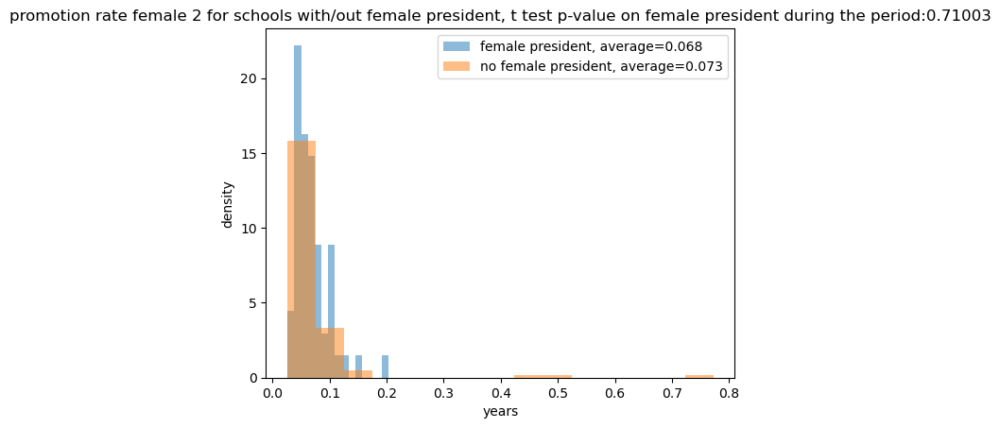

matched t test p-value on women president before 2012:0.73766


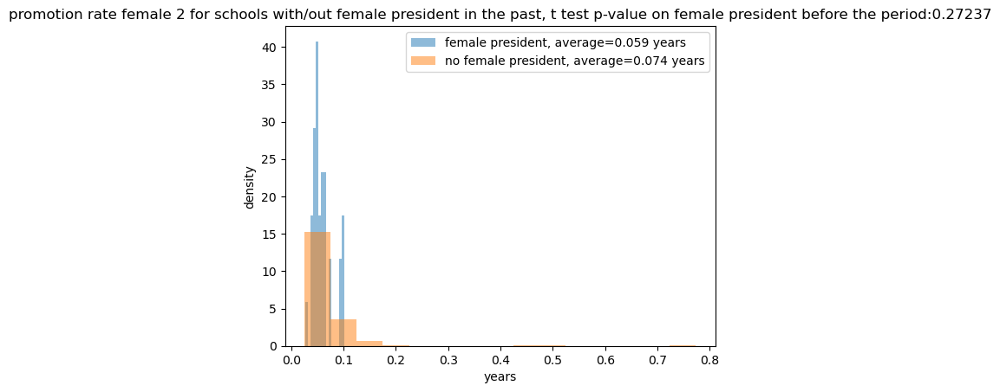

one way anova on REGION : F_onewayResult(statistic=1.8147897322145936, pvalue=0.08703023732668827)
one way anova on LOCALE : F_onewayResult(statistic=0.7298844931835292, pvalue=0.6649797304874343)
one way anova on CCUGPROF : F_onewayResult(statistic=1.5675443064674905, pvalue=0.1283244688140644)
one way anova on CCSIZSET : F_onewayResult(statistic=0.8539905054593082, pvalue=0.5300499565196672)
******** regression solely on rank ********

                               OLS Regression Results                              
Dep. Variable:     promotion rate female 2   R-squared:                       0.165
Model:                                 OLS   Adj. R-squared:                  0.152
Method:                      Least Squares   F-statistic:                     12.61
Date:                     Thu, 02 Nov 2023   Prob (F-statistic):           0.000726
Time:                             16:03:46   Log-Likelihood:                 63.100
No. Observations:                       66   AIC:     

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
1-15.0 1-16.0  -0.0023 0.9971 -0.0322  0.0276  False
1-15.0 2-15.0   0.0731 0.0002  0.0291  0.1171   True
1-15.0 2-16.0  -0.0106 0.9156  -0.053  0.0318  False
1-16.0 2-15.0   0.0754 0.0002    0.03  0.1208   True
1-16.0 2-16.0  -0.0083  0.961 -0.0521  0.0355  False
2-15.0 2-16.0  -0.0837 0.0006 -0.1382 -0.0293   True
----------------------------------------------------


,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.633672,0.010689
1,REGION,5,8,-2.533964,0.013777
2,REGION,5,7,-2.386625,0.020606
3,REGION,5,2,-2.147288,0.035002
4,REGION,5,3,-0.521466,0.603665
5,REGION,5,4,0.617985,0.539004
6,REGION,5,1,-0.847889,0.400313
7,REGION,6,8,0.477399,0.635813
8,REGION,6,7,0.088676,0.929970
9,REGION,6,2,-0.917034,0.363527


In [24]:
var_name = 'promotion rate female 2'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:3e-05


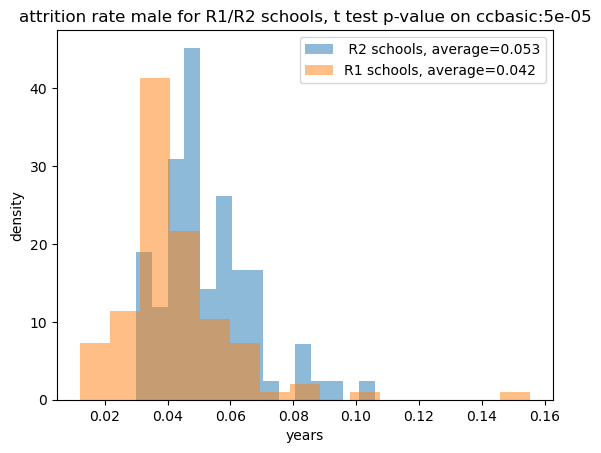

matched t test p-value on control:0.02465


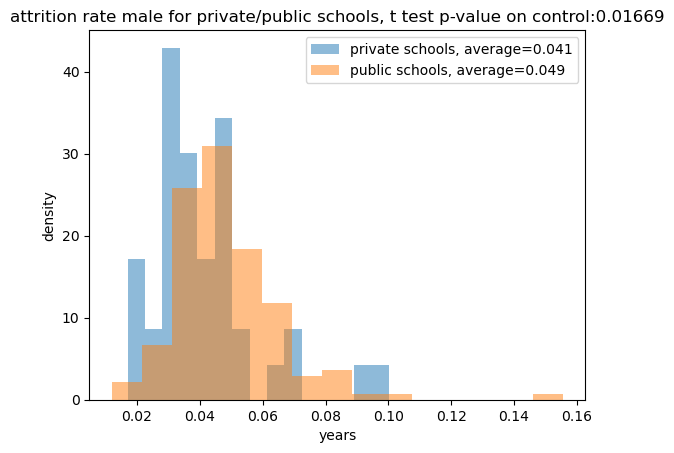

matched t test p-value on control:0.22354


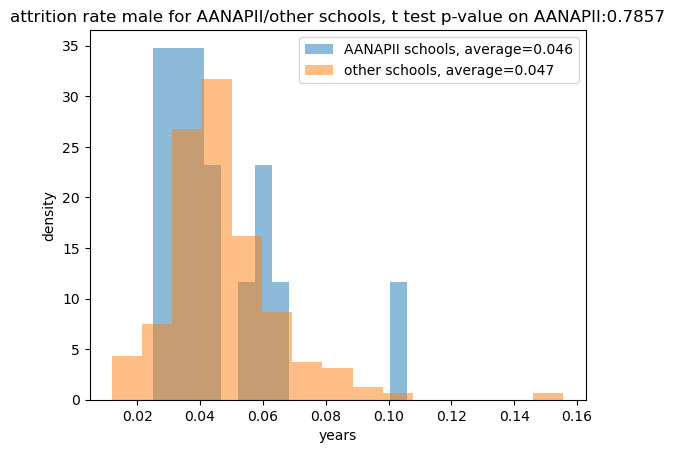

matched t test p-value on control:0.86736


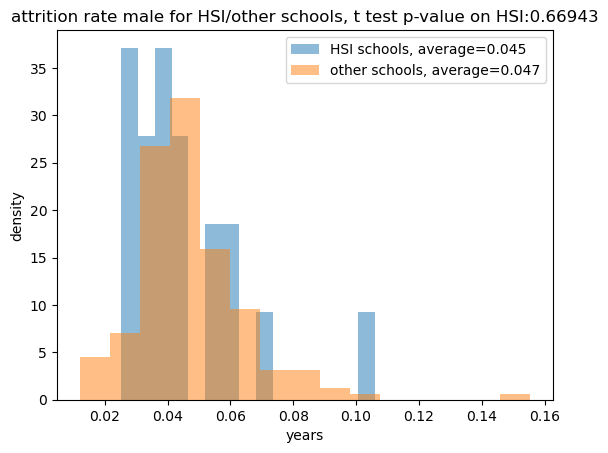

matched t test p-value on women president 2012-2019:0.03476


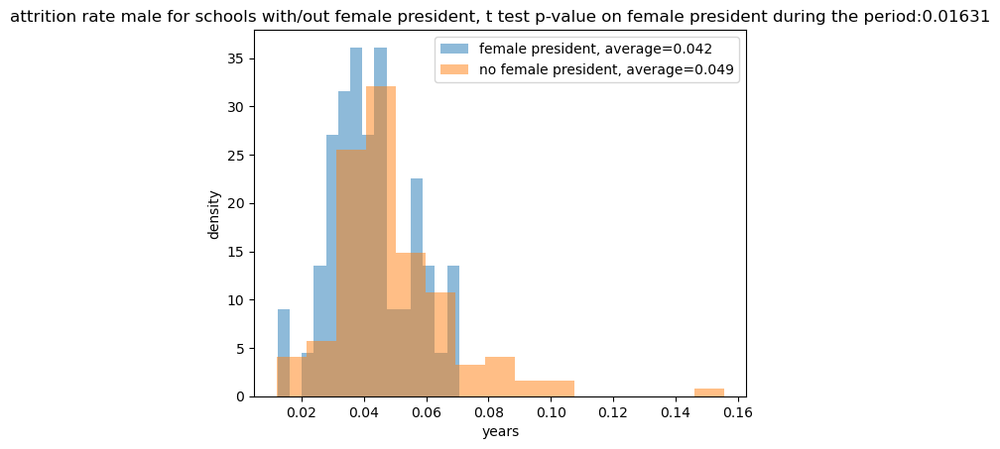

matched t test p-value on women president before 2012:0.57208


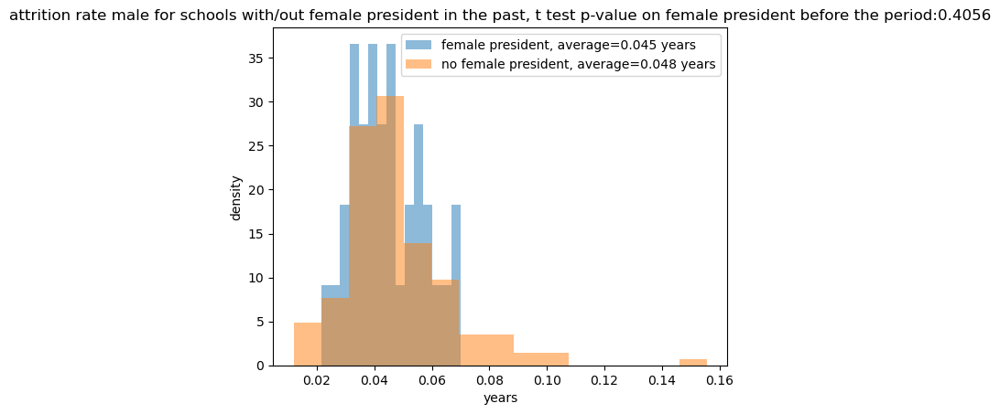

one way anova on REGION : F_onewayResult(statistic=1.6512245794309879, pvalue=0.12397020812326649)
one way anova on LOCALE : F_onewayResult(statistic=1.0529442887934248, pvalue=0.39847278714775936)
one way anova on CCUGPROF : F_onewayResult(statistic=3.5990991513820947, pvalue=0.00039132291715936494)
one way anova on CCSIZSET : F_onewayResult(statistic=1.6406993792751832, pvalue=0.1384417833051975)
******** regression solely on rank ********

                             OLS Regression Results                            
Dep. Variable:     attrition rate male   R-squared:                       0.007
Model:                             OLS   Adj. R-squared:                 -0.009
Method:                  Least Squares   F-statistic:                    0.4213
Date:                 Thu, 02 Nov 2023   Prob (F-statistic):              0.519
Time:                         16:03:47   Log-Likelihood:                 193.88
No. Observations:                   66   AIC:                            

******** regression on all variables and no controls, no interaction ********

                             OLS Regression Results                            
Dep. Variable:     attrition rate male   R-squared:                       0.158
Model:                             OLS   Adj. R-squared:                  0.139
Method:                  Least Squares   F-statistic:                     8.402
Date:                 Thu, 02 Nov 2023   Prob (F-statistic):           3.11e-06
Time:                         16:03:47   Log-Likelihood:                 496.88
No. Observations:                  184   AIC:                            -983.8
Df Residuals:                      179   BIC:                            -967.7
Df Model:                            4                                         
Covariance Type:             nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,1.671473,0.099751
1,REGION,5,8,2.875457,0.005497
2,REGION,5,7,0.714075,0.478314
3,REGION,5,2,1.399389,0.165819
4,REGION,5,3,0.214003,0.831158
5,REGION,5,4,-0.415870,0.679040
6,REGION,5,1,2.252046,0.028487
7,REGION,6,8,1.035030,0.307197
8,REGION,6,7,-0.600481,0.553016
9,REGION,6,2,-0.189911,0.850148


In [25]:
var_name = 'attrition rate male'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:3e-05


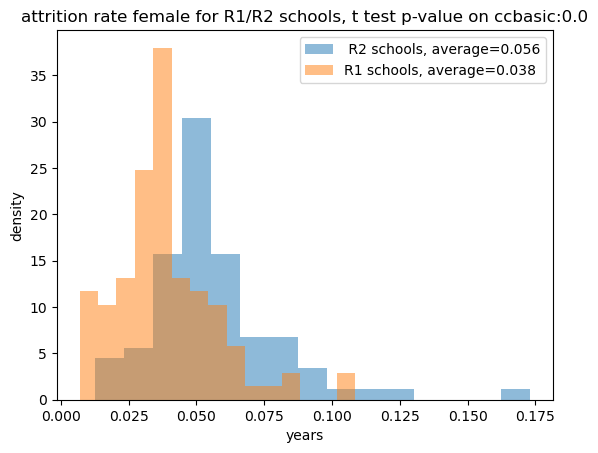

matched t test p-value on control:0.12669


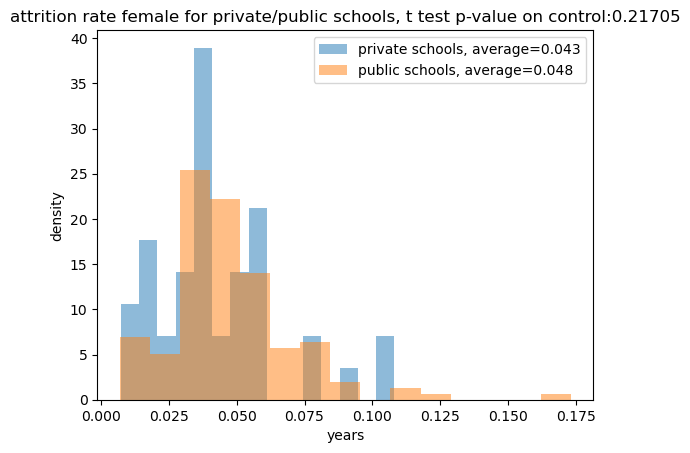

matched t test p-value on control:0.23824


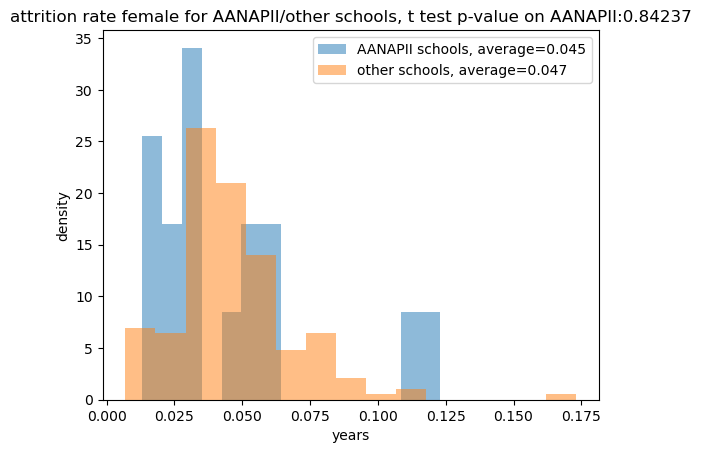

matched t test p-value on control:0.36055


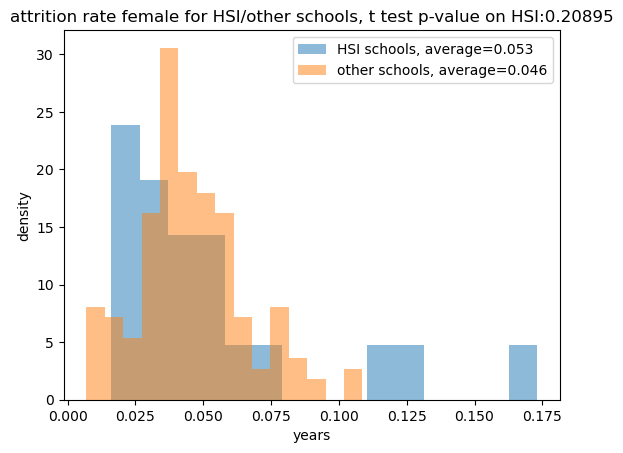

matched t test p-value on women president 2012-2019:0.23917


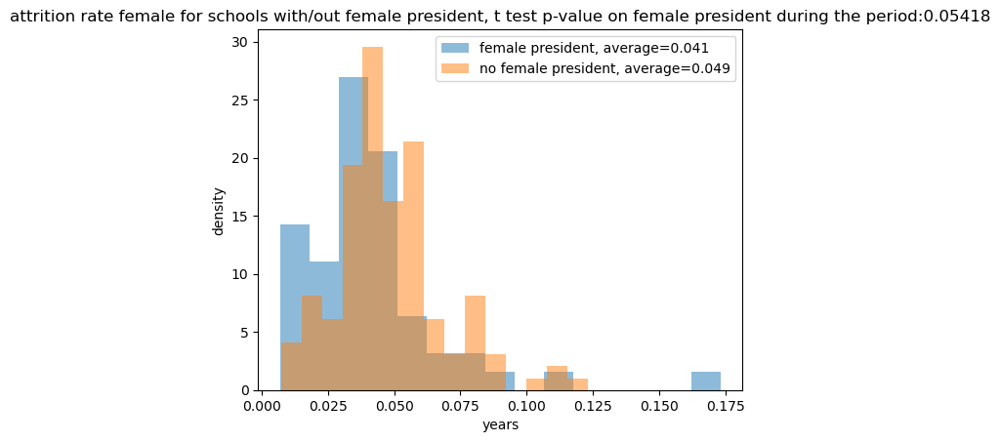

matched t test p-value on women president before 2012:0.33802


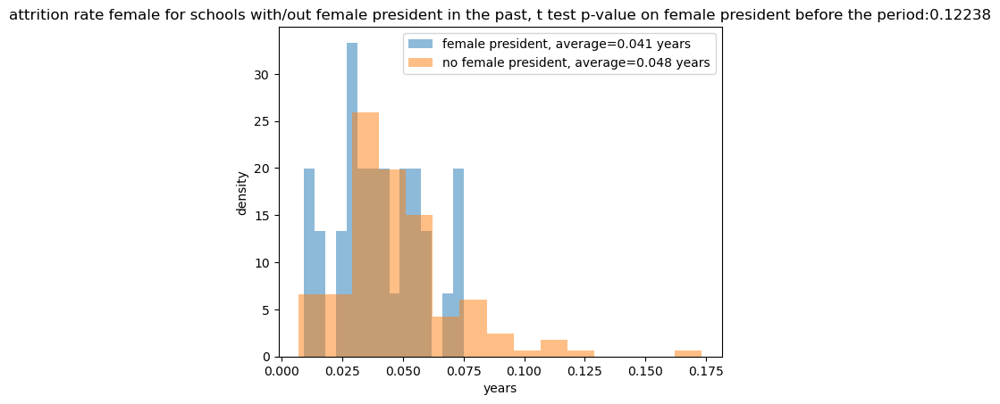

one way anova on REGION : F_onewayResult(statistic=1.4610112612379735, pvalue=0.18403401548862572)
one way anova on LOCALE : F_onewayResult(statistic=1.588374668493918, pvalue=0.1312386187251586)
one way anova on CCUGPROF : F_onewayResult(statistic=3.898432154375653, pvalue=0.00015726014197195199)
one way anova on CCSIZSET : F_onewayResult(statistic=2.0768405850785627, pvalue=0.05813983793268387)
******** regression solely on rank ********

                              OLS Regression Results                             
Dep. Variable:     attrition rate female   R-squared:                       0.020
Model:                               OLS   Adj. R-squared:                  0.005
Method:                    Least Squares   F-statistic:                     1.312
Date:                   Thu, 02 Nov 2023   Prob (F-statistic):              0.256
Time:                           16:03:48   Log-Likelihood:                 177.47
No. Observations:                     66   AIC:                

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
1-15.0 1-16.0   0.0193    0.0  0.0098  0.0287   True
1-15.0 2-15.0  -0.0039 0.8855 -0.0178    0.01  False
1-15.0 2-16.0   0.0097 0.2394 -0.0037  0.0231  False
1-16.0 2-15.0  -0.0232 0.0003 -0.0376 -0.0088   True
1-16.0 2-16.0  -0.0096 0.2828 -0.0234  0.0043  False
2-15.0 2-16.0   0.0136 0.1727 -0.0036  0.0309  False
----------------------------------------------------


,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-0.089313,0.929125
1,REGION,5,8,3.292421,0.001631
2,REGION,5,7,1.258519,0.213720
3,REGION,5,2,0.772401,0.442304
4,REGION,5,3,0.883424,0.379989
5,REGION,5,4,0.668387,0.506538
6,REGION,5,1,1.328535,0.189694
7,REGION,6,8,2.089015,0.043456
8,REGION,6,7,0.814235,0.422381
9,REGION,6,2,0.557225,0.579860


In [26]:
var_name = 'attrition rate female'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.0


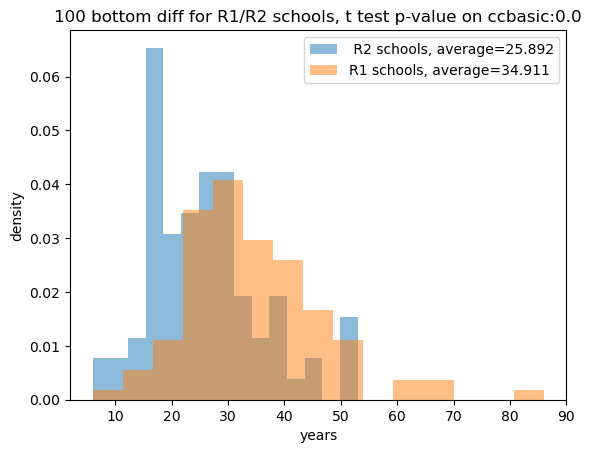

matched t test p-value on control:0.92725


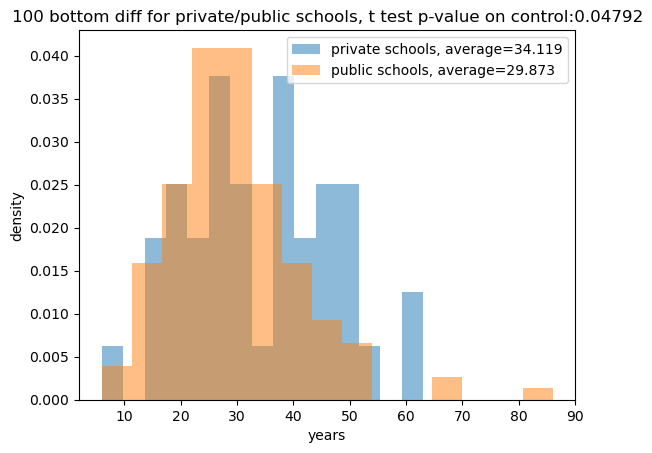

matched t test p-value on control:0.0183


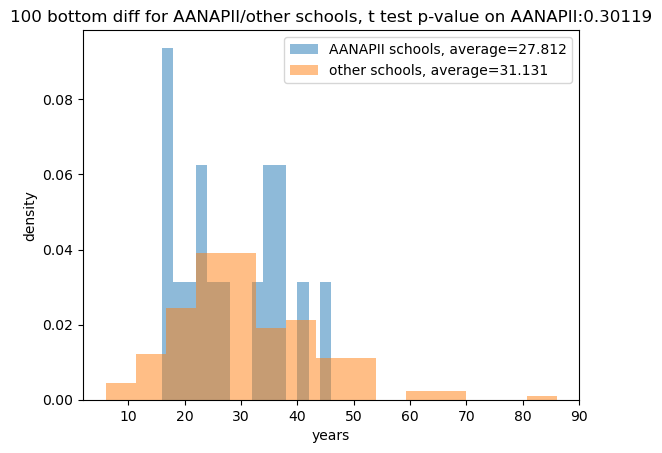

matched t test p-value on control:0.90976


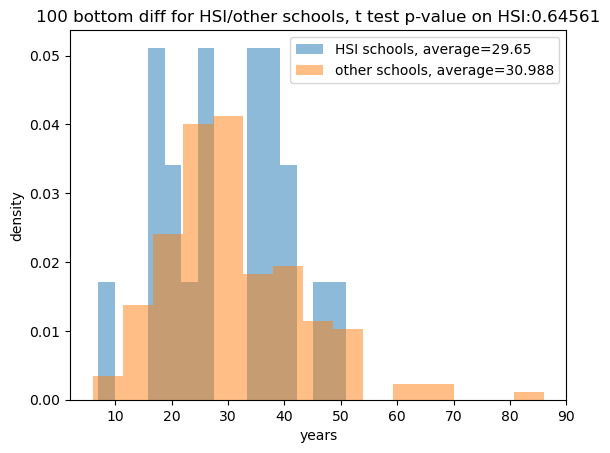

matched t test p-value on women president 2012-2019:0.10076


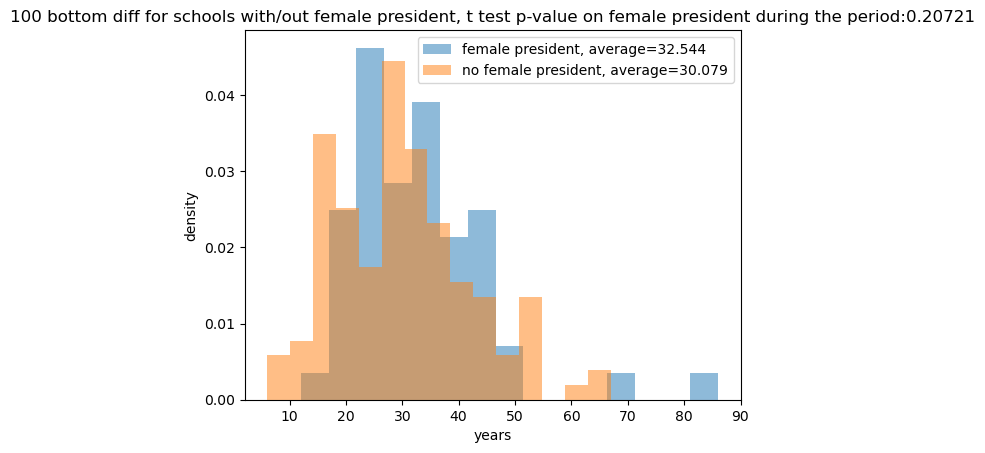

matched t test p-value on women president before 2012:0.00975


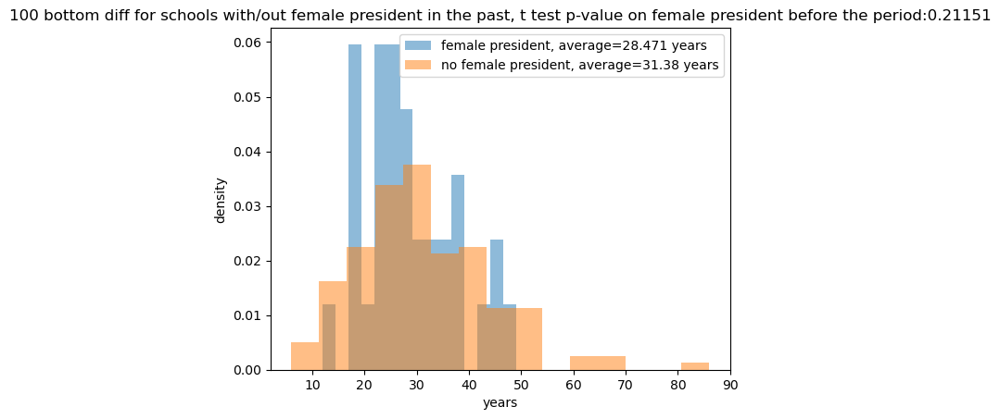

one way anova on REGION : F_onewayResult(statistic=0.5833325869087733, pvalue=0.7689276138390868)
one way anova on LOCALE : F_onewayResult(statistic=0.8839859867610199, pvalue=0.5311798286048779)
one way anova on CCUGPROF : F_onewayResult(statistic=2.8026215968402908, pvalue=0.0042685079530599855)
one way anova on CCSIZSET : F_onewayResult(statistic=1.2568971961953614, pvalue=0.2797244156584653)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:        100 bottom diff   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.043
Date:                Thu, 02 Nov 2023   Prob (F-statistic):              0.311
Time:                        16:03:49   Log-Likelihood:                -259.46
No. Observations:                  66   AIC:                             522.9
Df 

******** regression on all variables and no controls, no interaction ********

                            OLS Regression Results                            
Dep. Variable:        100 bottom diff   R-squared:                       0.208
Model:                            OLS   Adj. R-squared:                  0.191
Method:                 Least Squares   F-statistic:                     11.78
Date:                Thu, 02 Nov 2023   Prob (F-statistic):           1.61e-08
Time:                        16:03:49   Log-Likelihood:                -699.88
No. Observations:                 184   AIC:                             1410.
Df Residuals:                     179   BIC:                             1426.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-1.655859,0.102886
1,REGION,5,8,-0.024804,0.980289
2,REGION,5,7,0.075633,0.939996
3,REGION,5,2,-0.688729,0.493119
4,REGION,5,3,0.188298,0.851180
5,REGION,5,4,-0.021794,0.982687
6,REGION,5,1,-0.168229,0.867043
7,REGION,6,8,1.366979,0.179665
8,REGION,6,7,1.016533,0.318079
9,REGION,6,2,0.846318,0.401408


In [27]:
var_name = '100 bottom diff'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.00035


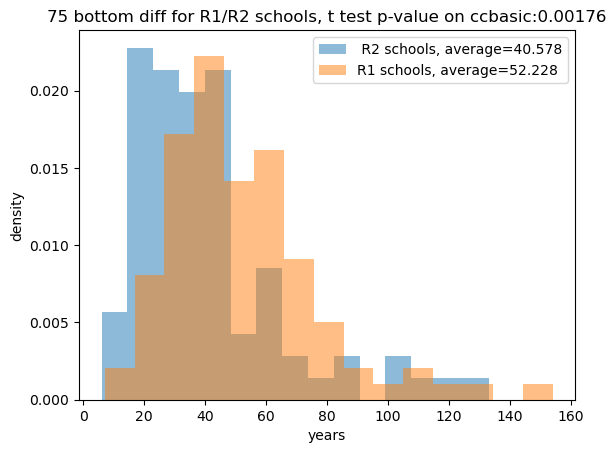

matched t test p-value on control:0.80106


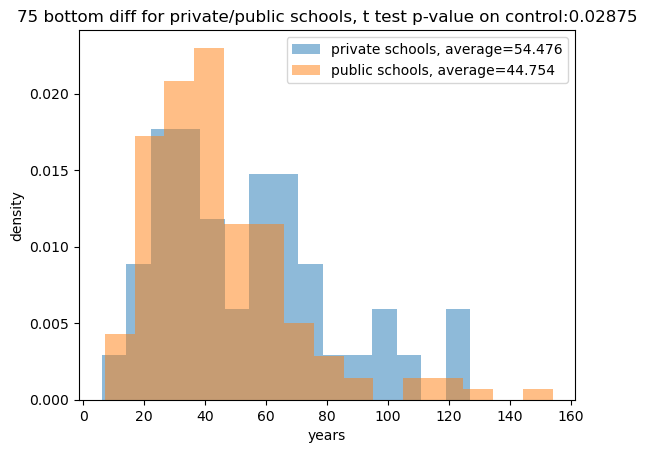

matched t test p-value on control:0.32688


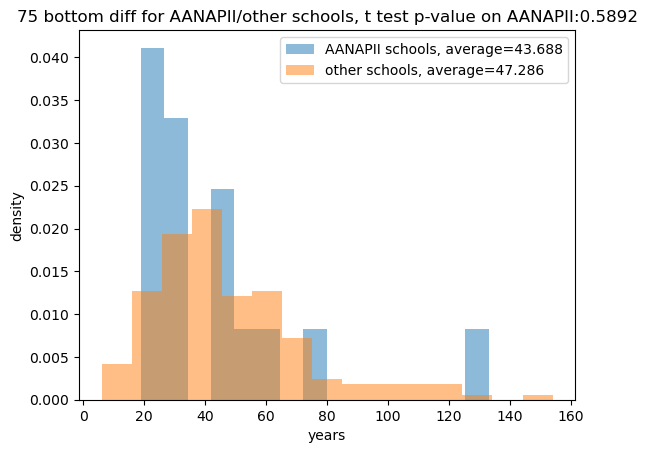

matched t test p-value on control:0.32263


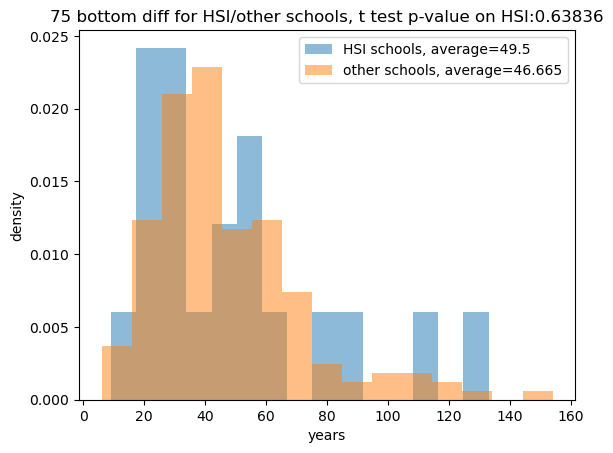

matched t test p-value on women president 2012-2019:0.18006


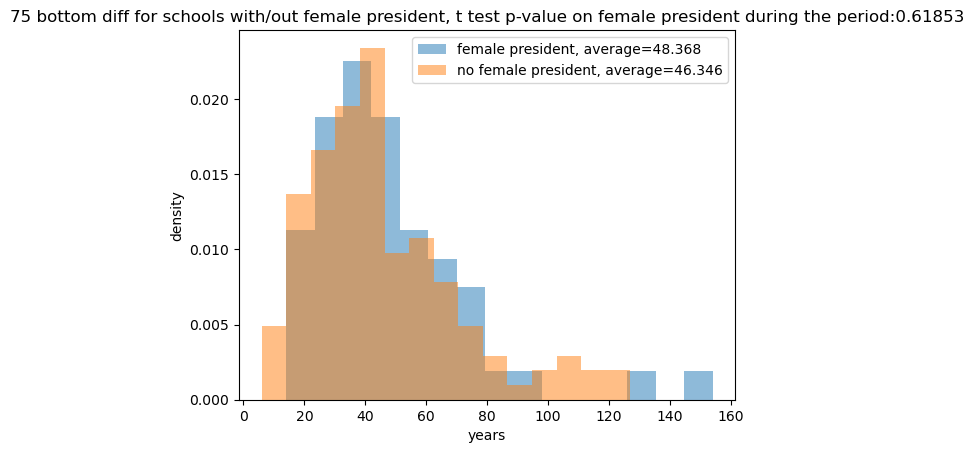

matched t test p-value on women president before 2012:0.00301


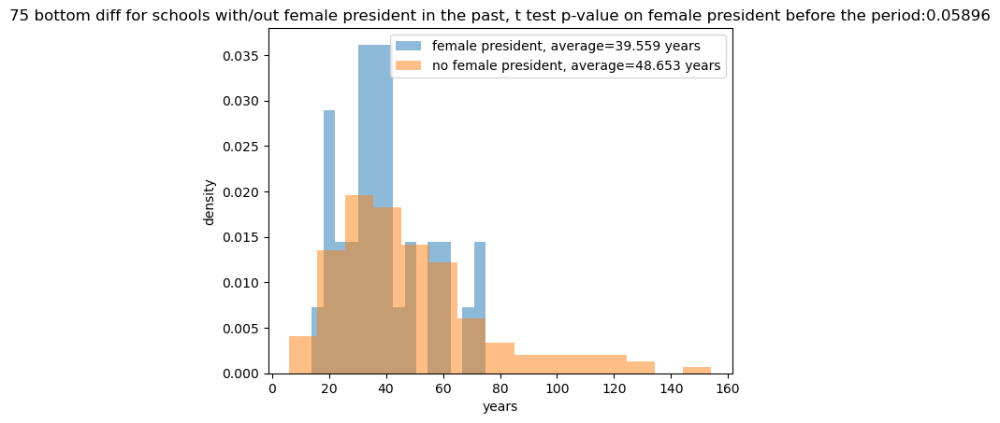

one way anova on REGION : F_onewayResult(statistic=1.3690309960038096, pvalue=0.22111216472440048)
one way anova on LOCALE : F_onewayResult(statistic=0.4952262631925927, pvalue=0.858532711291014)
one way anova on CCUGPROF : F_onewayResult(statistic=1.715043204402726, pvalue=0.08869293294165458)
one way anova on CCSIZSET : F_onewayResult(statistic=1.0302303510743043, pvalue=0.4072435354210204)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:         75 bottom diff   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.4940
Date:                Thu, 02 Nov 2023   Prob (F-statistic):              0.485
Time:                        16:03:50   Log-Likelihood:                -306.90
No. Observations:                  66   AIC:                             617.8
Df Res

                 sum_sq     df         F   PR(>F)
group      11365.637305    3.0  6.405628  0.00038
Residual  106459.226826  180.0       NaN      NaN
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
1-15.0 1-16.0  -9.3679 0.1084 -20.0592  1.3233  False
1-15.0 2-15.0  17.4222 0.0236   1.6754 33.1691   True
1-15.0 2-16.0  -4.9596 0.8312 -20.1215 10.2023  False
1-16.0 2-15.0  26.7902 0.0002  10.5402 43.0401   True
1-16.0 2-16.0   4.4083 0.8854 -11.2755 20.0922  False
2-15.0 2-16.0 -22.3818 0.0172 -41.8663 -2.8974   True
-----------------------------------------------------


,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.292406,0.025346
1,REGION,5,8,0.207317,0.836431
2,REGION,5,7,0.271278,0.787231
3,REGION,5,2,-1.315133,0.192472
4,REGION,5,3,0.287613,0.774481
5,REGION,5,4,0.186468,0.852728
6,REGION,5,1,-0.867636,0.389505
7,REGION,6,8,1.930347,0.061052
8,REGION,6,7,1.468361,0.153152
9,REGION,6,2,0.864894,0.391228


In [28]:
var_name = '75 bottom diff'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.0


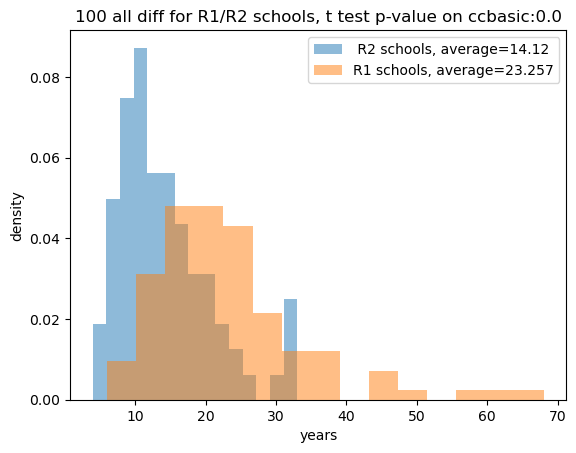

matched t test p-value on control:0.8593


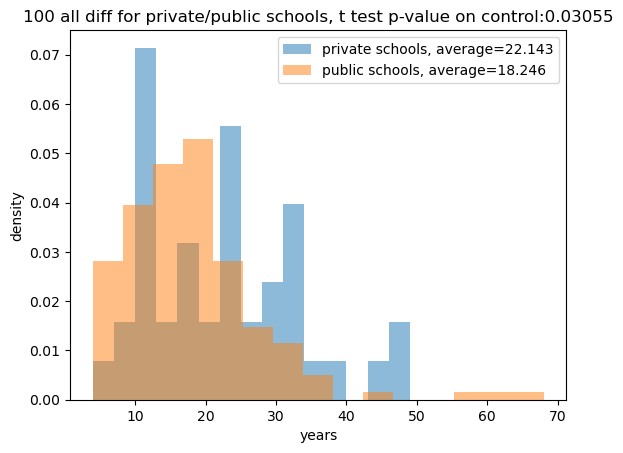

matched t test p-value on control:0.02494


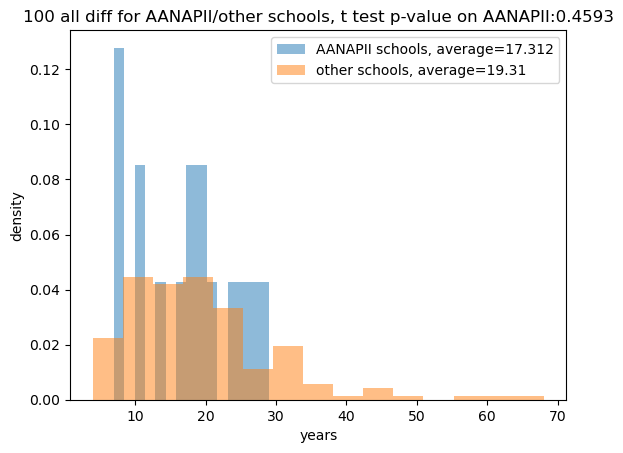

matched t test p-value on control:0.88886


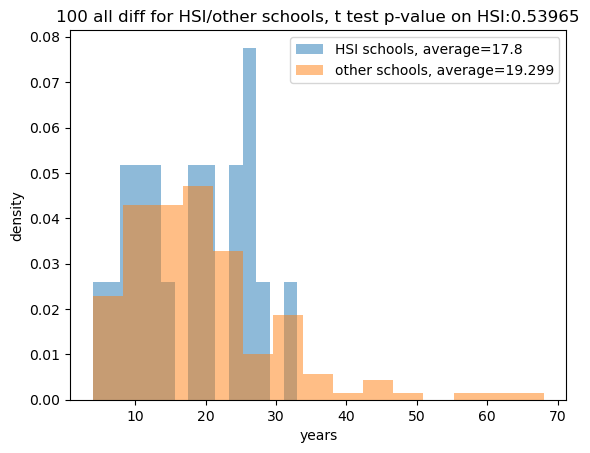

matched t test p-value on women president 2012-2019:0.07038


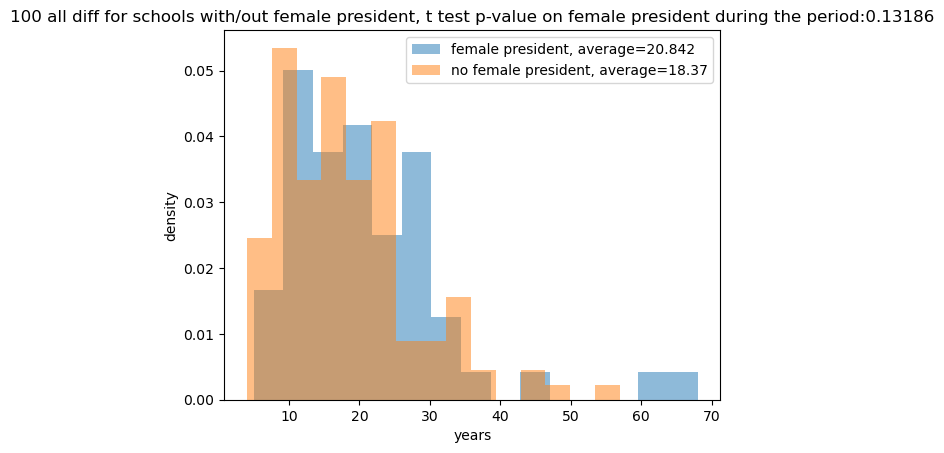

matched t test p-value on women president before 2012:0.08874


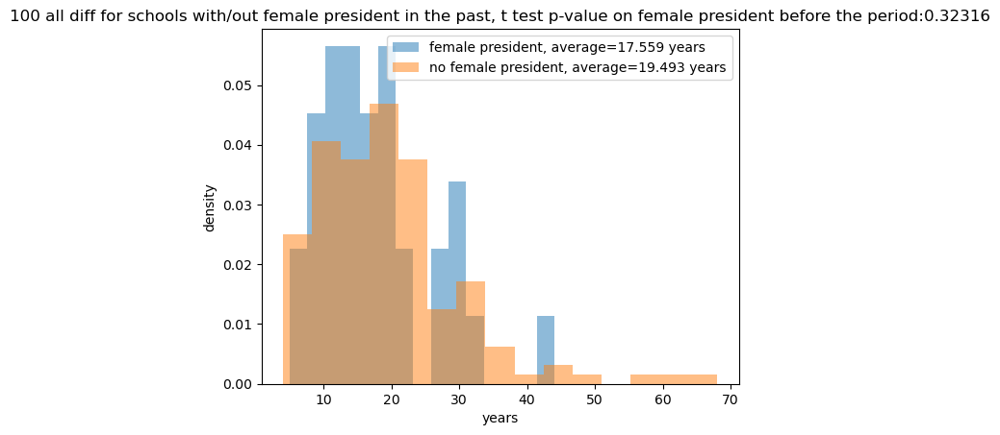

one way anova on REGION : F_onewayResult(statistic=0.5351321691848172, pvalue=0.8070846852473355)
one way anova on LOCALE : F_onewayResult(statistic=1.4495520154654415, pvalue=0.17907302977022466)
one way anova on CCUGPROF : F_onewayResult(statistic=3.9684024046843893, pvalue=0.00012701161339234574)
one way anova on CCSIZSET : F_onewayResult(statistic=1.471868660402534, pvalue=0.19027725129729378)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:           100 all diff   R-squared:                       0.065
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                     4.439
Date:                Thu, 02 Nov 2023   Prob (F-statistic):             0.0391
Time:                        16:03:50   Log-Likelihood:                -249.12
No. Observations:                  66   AIC:                             502.2
D

                sum_sq     df          F        PR(>F)
group      4646.635442    3.0  18.974936  9.742287e-11
Residual  14692.967819  180.0        NaN           NaN
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
1-15.0 1-16.0  -8.6227    0.0 -12.5946 -4.6509   True
1-15.0 2-15.0   6.5994 0.0201   0.7494 12.4494   True
1-15.0 2-16.0  -5.6324   0.05 -11.2652  0.0003  False
1-16.0 2-15.0  15.2221    0.0   9.1852 21.2591   True
1-16.0 2-16.0   2.9903 0.5445  -2.8363  8.8169  False
2-15.0 2-16.0 -12.2318 0.0001 -19.4704 -4.9933   True
-----------------------------------------------------


,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-1.445684,0.153384
1,REGION,5,8,-0.847583,0.399879
2,REGION,5,7,-0.400548,0.690363
3,REGION,5,2,-0.650098,0.517615
4,REGION,5,3,0.215475,0.830015
5,REGION,5,4,-0.040312,0.967983
6,REGION,5,1,0.276377,0.783333
7,REGION,6,8,0.620967,0.538329
8,REGION,6,7,0.544487,0.590417
9,REGION,6,2,0.779468,0.439378


In [29]:
var_name = '100 all diff'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:2e-05


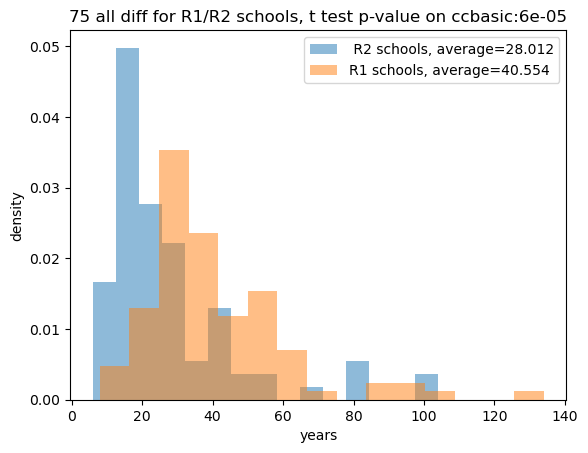

matched t test p-value on control:0.91115


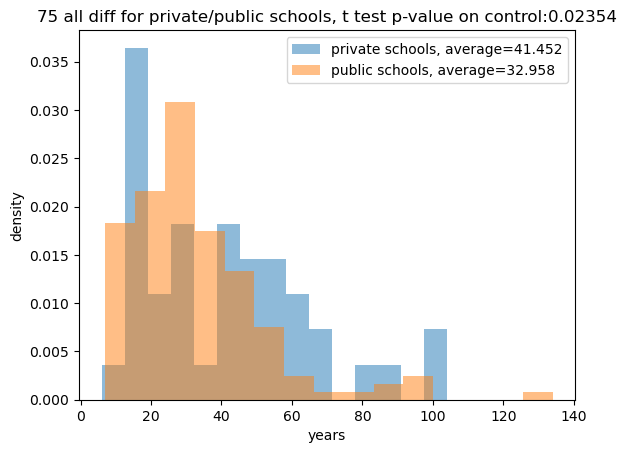

matched t test p-value on control:0.26574


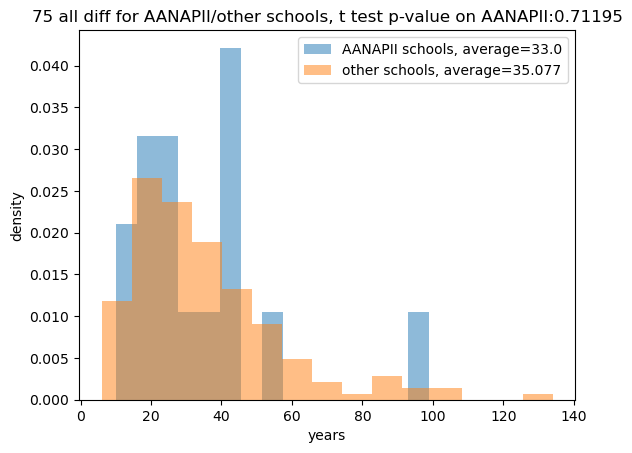

matched t test p-value on control:0.24712


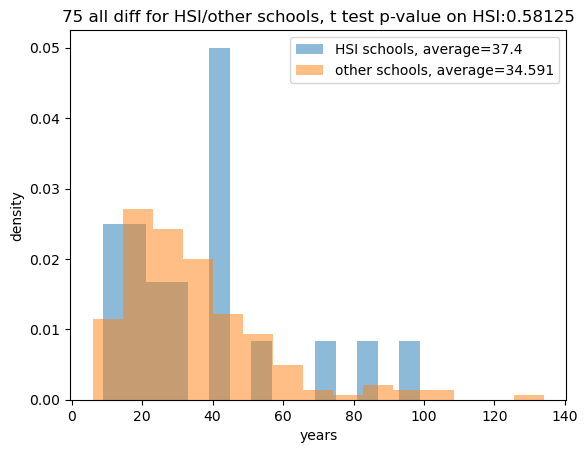

matched t test p-value on women president 2012-2019:0.07532


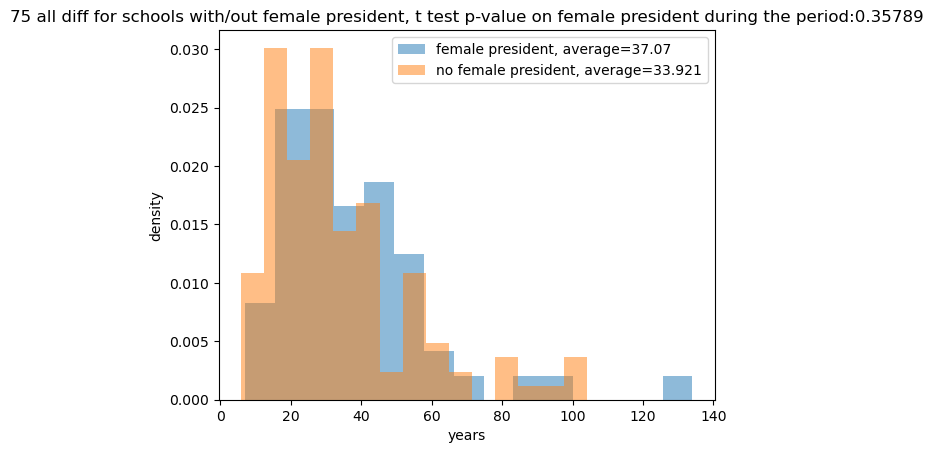

matched t test p-value on women president before 2012:0.01775


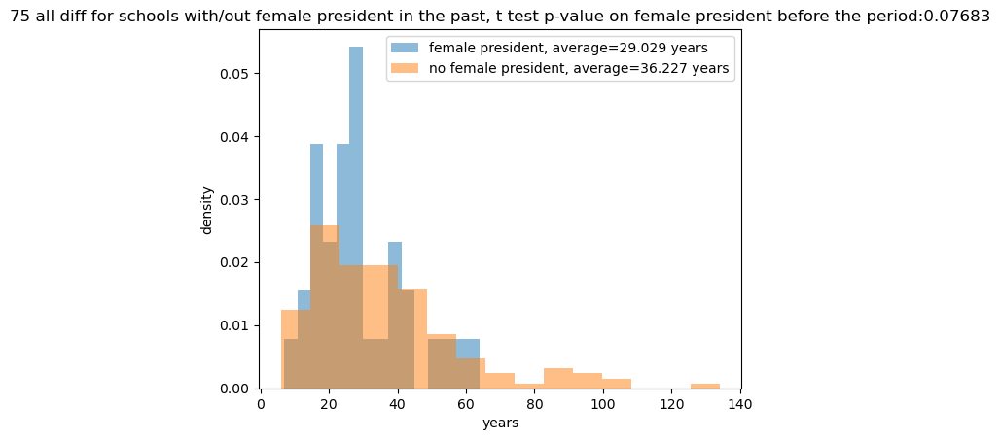

one way anova on REGION : F_onewayResult(statistic=1.3043120443554281, pvalue=0.2507502298973956)
one way anova on LOCALE : F_onewayResult(statistic=0.650411441269689, pvalue=0.7344005857983132)
one way anova on CCUGPROF : F_onewayResult(statistic=2.262126458859064, pvalue=0.020301947508329494)
one way anova on CCSIZSET : F_onewayResult(statistic=1.1143119451135712, pvalue=0.3557904926515857)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:            75 all diff   R-squared:                       0.030
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     1.965
Date:                Thu, 02 Nov 2023   Prob (F-statistic):              0.166
Time:                        16:03:51   Log-Likelihood:                -295.41
No. Observations:                  66   AIC:                             594.8
Df Res

******** regression on all variables and no controls, no interaction ********

                            OLS Regression Results                            
Dep. Variable:            75 all diff   R-squared:                       0.172
Model:                            OLS   Adj. R-squared:                  0.154
Method:                 Least Squares   F-statistic:                     9.316
Date:                Thu, 02 Nov 2023   Prob (F-statistic):           7.33e-07
Time:                        16:03:51   Log-Likelihood:                -807.02
No. Observations:                 184   AIC:                             1624.
Df Residuals:                     179   BIC:                             1640.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.327031,0.023300
1,REGION,5,8,-0.352463,0.725668
2,REGION,5,7,-0.090867,0.927941
3,REGION,5,2,-1.363548,0.176789
4,REGION,5,3,0.175076,0.861519
5,REGION,5,4,0.122572,0.902870
6,REGION,5,1,-0.413825,0.680672
7,REGION,6,8,1.673072,0.102527
8,REGION,6,7,1.263399,0.216865
9,REGION,6,2,0.931872,0.355881


In [30]:
var_name = '75 all diff'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.0


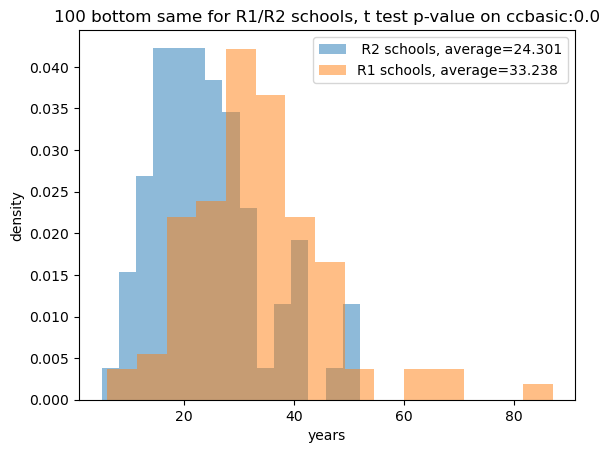

matched t test p-value on control:0.94793


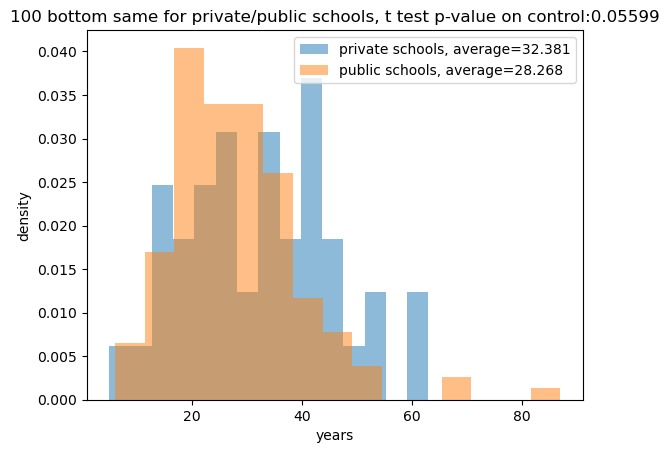

matched t test p-value on control:0.02235


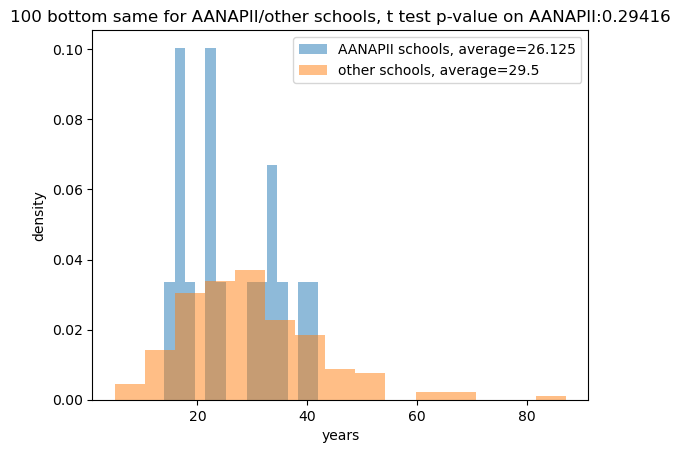

matched t test p-value on control:0.73208


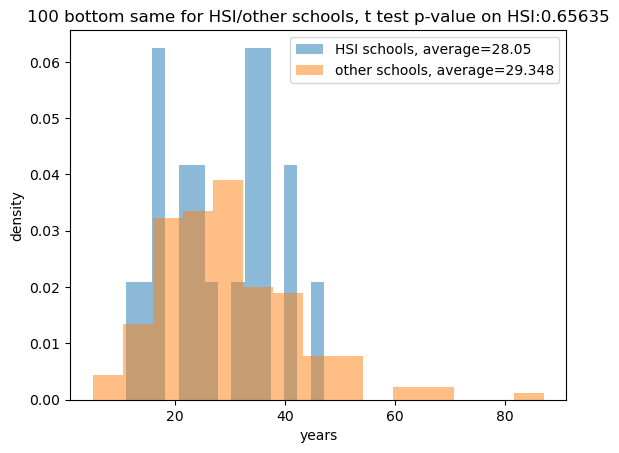

matched t test p-value on women president 2012-2019:0.07585


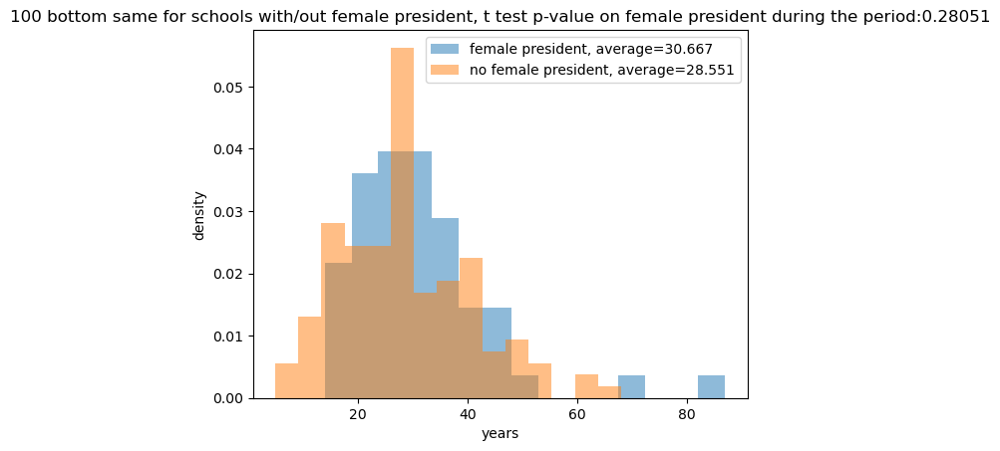

matched t test p-value on women president before 2012:0.02912


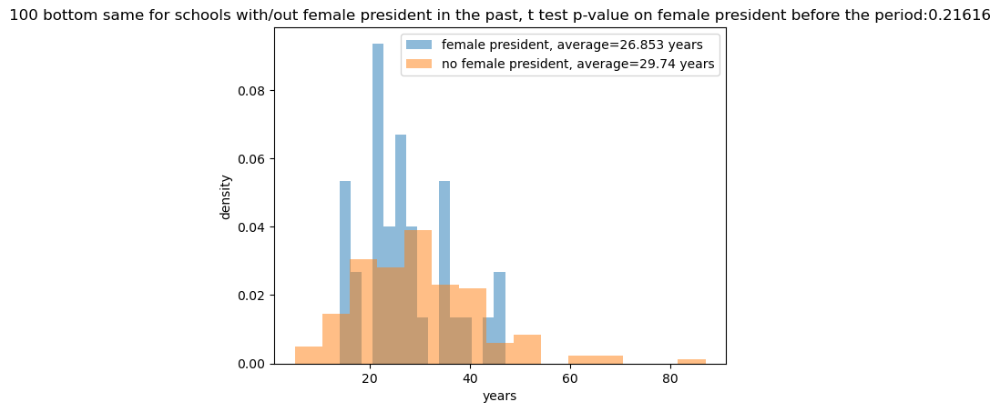

one way anova on REGION : F_onewayResult(statistic=0.5903017292769913, pvalue=0.7632828799742453)
one way anova on LOCALE : F_onewayResult(statistic=0.7700438142505258, pvalue=0.6296051148258639)
one way anova on CCUGPROF : F_onewayResult(statistic=2.9337706645300963, pvalue=0.0028960372833095774)
one way anova on CCSIZSET : F_onewayResult(statistic=1.721943065146075, pvalue=0.11831999537182232)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:        100 bottom same   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9822
Date:                Thu, 02 Nov 2023   Prob (F-statistic):              0.325
Time:                        16:03:52   Log-Likelihood:                -260.55
No. Observations:                  66   AIC:                             525.1
Df 

 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
1-15.0 1-16.0  -8.2574 0.0002 -13.2197 -3.2952   True
1-15.0 2-15.0   7.1852 0.0559  -0.1236  14.494  False
1-15.0 2-16.0  -5.4512 0.1886 -12.4885  1.5861  False
1-16.0 2-15.0  15.4426    0.0   7.9003 22.9849   True
1-16.0 2-16.0   2.8063 0.7498  -4.4733 10.0858  False
2-15.0 2-16.0 -12.6364 0.0021 -21.6799 -3.5928   True
-----------------------------------------------------


,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-1.645979,0.104911
1,REGION,5,8,-0.016322,0.987029
2,REGION,5,7,0.079845,0.936661
3,REGION,5,2,-0.885278,0.378836
4,REGION,5,3,-0.111661,0.911407
5,REGION,5,4,-0.074353,0.940986
6,REGION,5,1,-0.665246,0.508778
7,REGION,6,8,1.349737,0.185086
8,REGION,6,7,0.996665,0.327463
9,REGION,6,2,0.730263,0.468637


In [31]:
var_name = '100 bottom same'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.00037


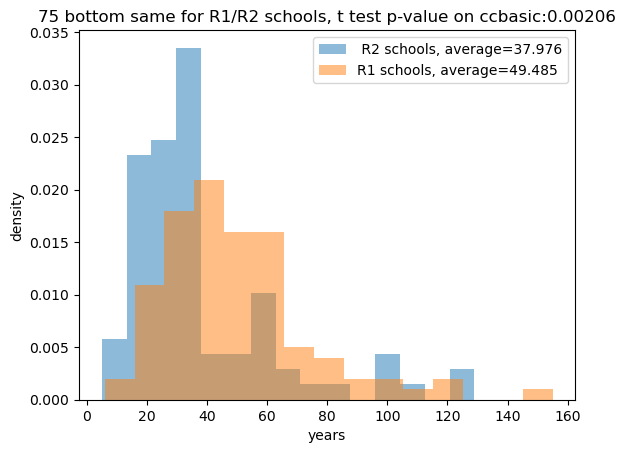

matched t test p-value on control:0.87945


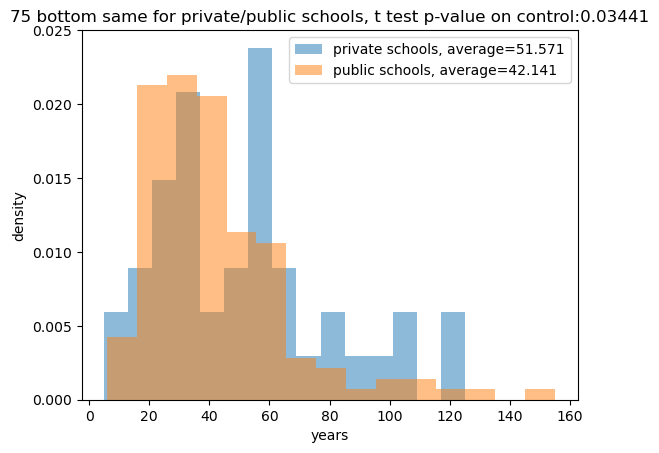

matched t test p-value on control:0.36788


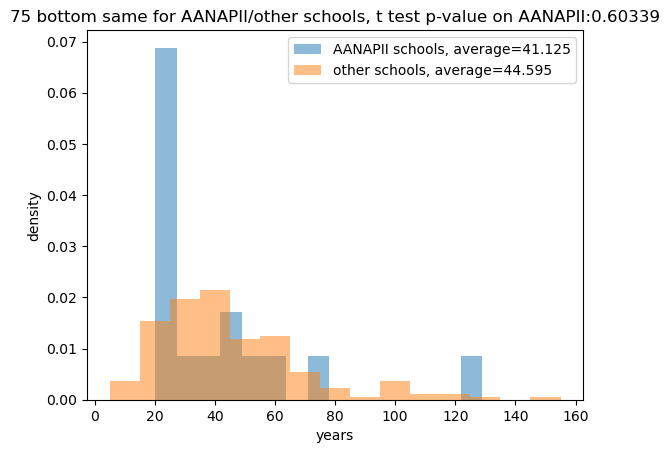

matched t test p-value on control:0.20004


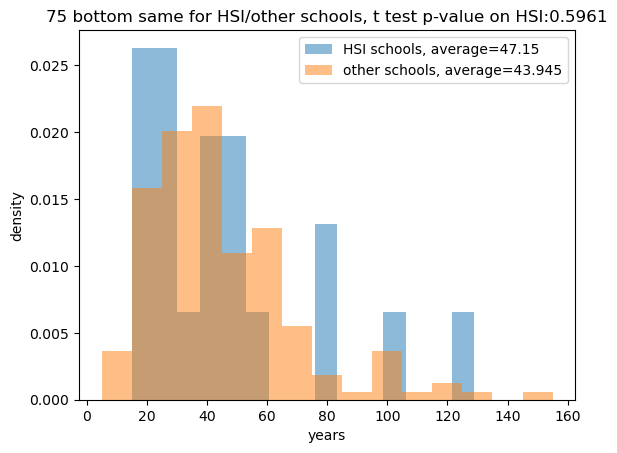

matched t test p-value on women president 2012-2019:0.12527


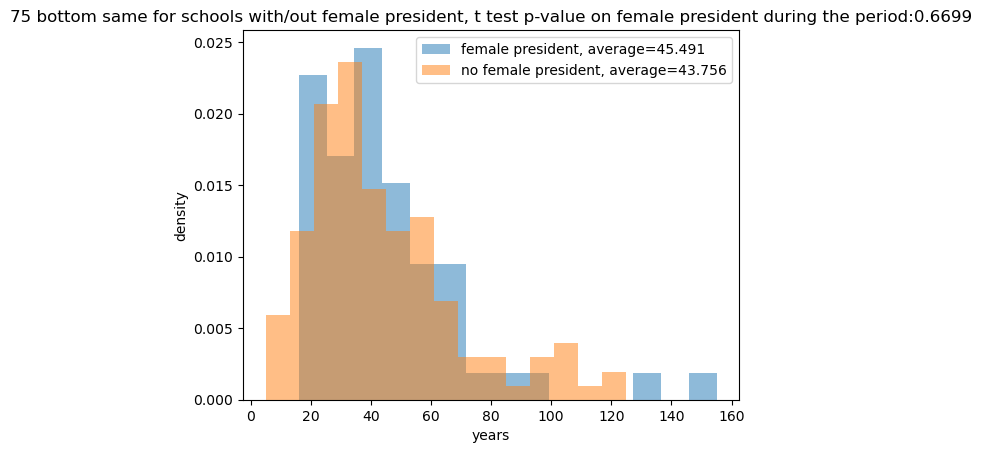

matched t test p-value on women president before 2012:0.00924


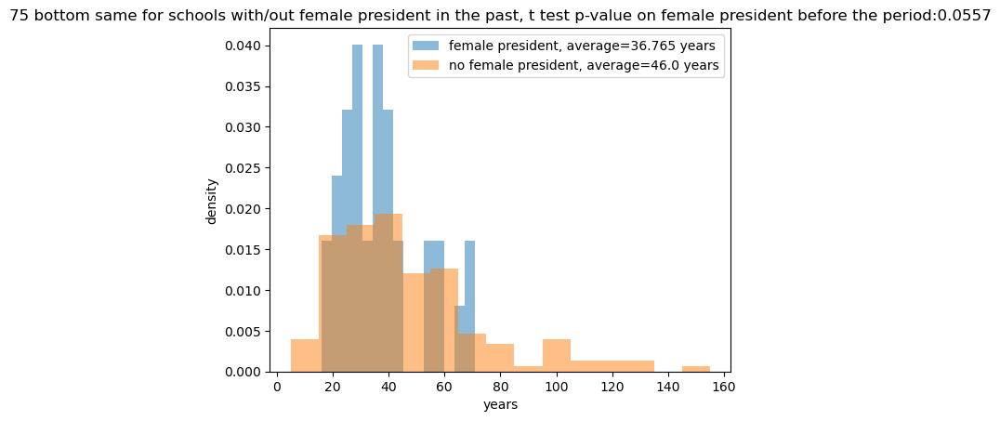

one way anova on REGION : F_onewayResult(statistic=1.4211280207737838, pvalue=0.19941044765457025)
one way anova on LOCALE : F_onewayResult(statistic=0.4611691146476844, pvalue=0.8820294342758339)
one way anova on CCUGPROF : F_onewayResult(statistic=1.7049831797426778, pvalue=0.09099809160989412)
one way anova on CCSIZSET : F_onewayResult(statistic=1.4398981314137107, pvalue=0.20180286140058093)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:         75 bottom same   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                 -0.007
Method:                 Least Squares   F-statistic:                    0.5356
Date:                Thu, 02 Nov 2023   Prob (F-statistic):              0.467
Time:                        16:03:53   Log-Likelihood:                -307.20
No. Observations:                  66   AIC:                             618.4
Df 

******** regression on all variables and no controls, no interaction ********

                            OLS Regression Results                            
Dep. Variable:         75 bottom same   R-squared:                       0.123
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     6.252
Date:                Thu, 02 Nov 2023   Prob (F-statistic):           9.89e-05
Time:                        16:03:53   Log-Likelihood:                -844.00
No. Observations:                 184   AIC:                             1698.
Df Residuals:                     179   BIC:                             1714.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.309570,0.024312
1,REGION,5,8,0.120136,0.904758
2,REGION,5,7,0.243786,0.808337
3,REGION,5,2,-1.487814,0.140993
4,REGION,5,3,-0.011203,0.991093
5,REGION,5,4,0.159653,0.873709
6,REGION,5,1,-1.246902,0.217916
7,REGION,6,8,1.886041,0.066950
8,REGION,6,7,1.445038,0.159547
9,REGION,6,2,0.775330,0.441796


In [32]:
var_name = '75 bottom same'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:0.0


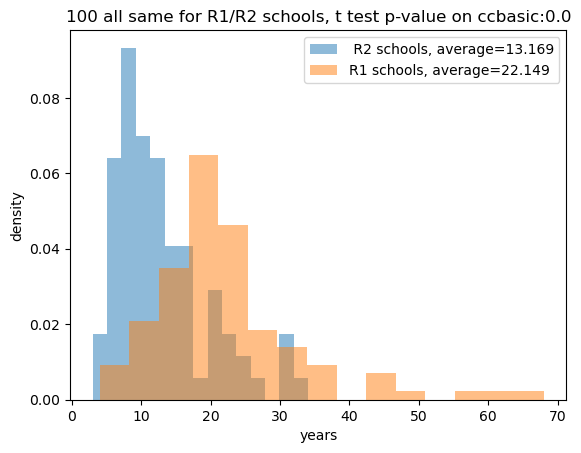

matched t test p-value on control:0.93492


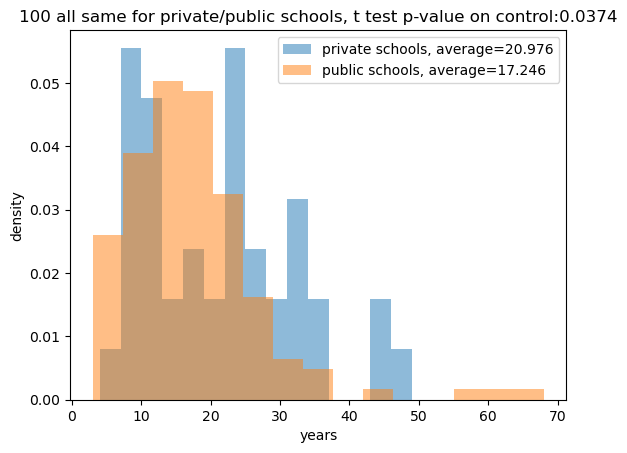

matched t test p-value on control:0.02385


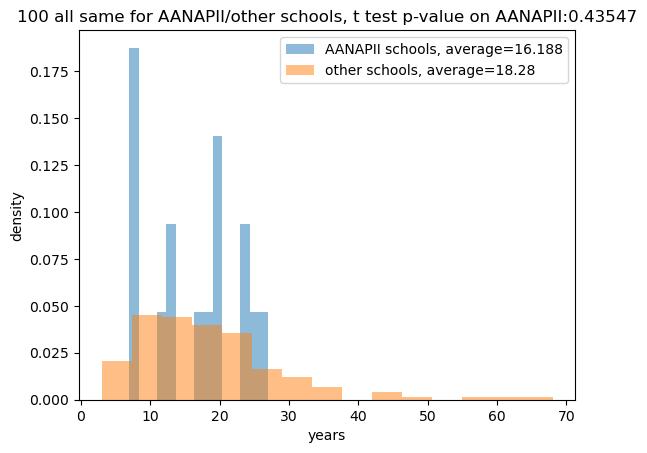

matched t test p-value on control:0.91274


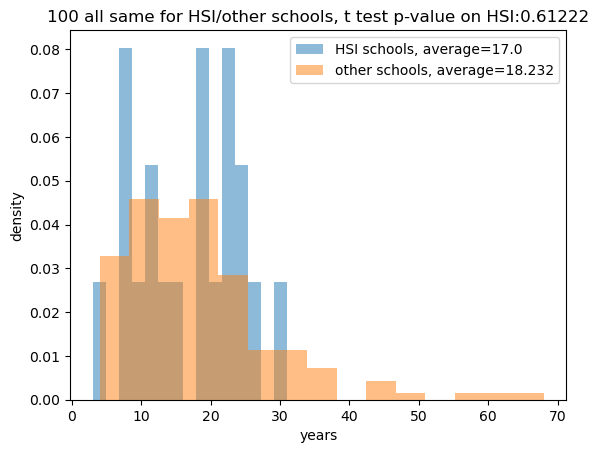

matched t test p-value on women president 2012-2019:0.03903


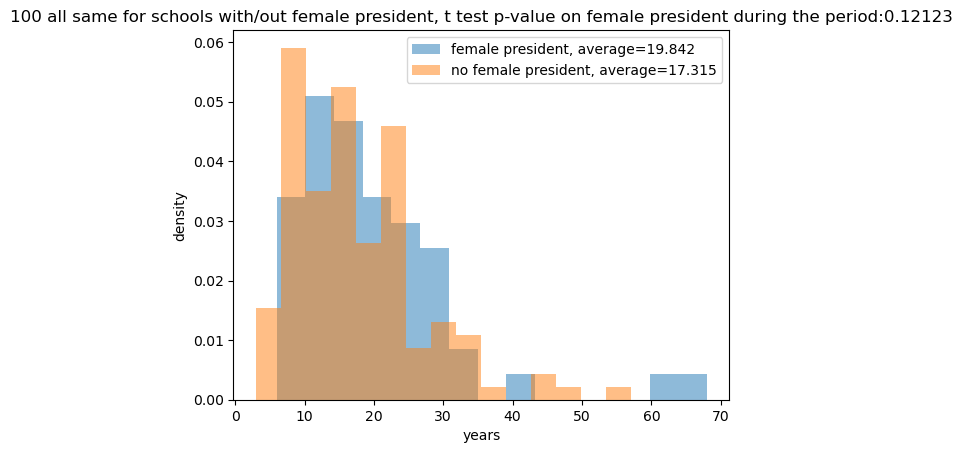

matched t test p-value on women president before 2012:0.2066


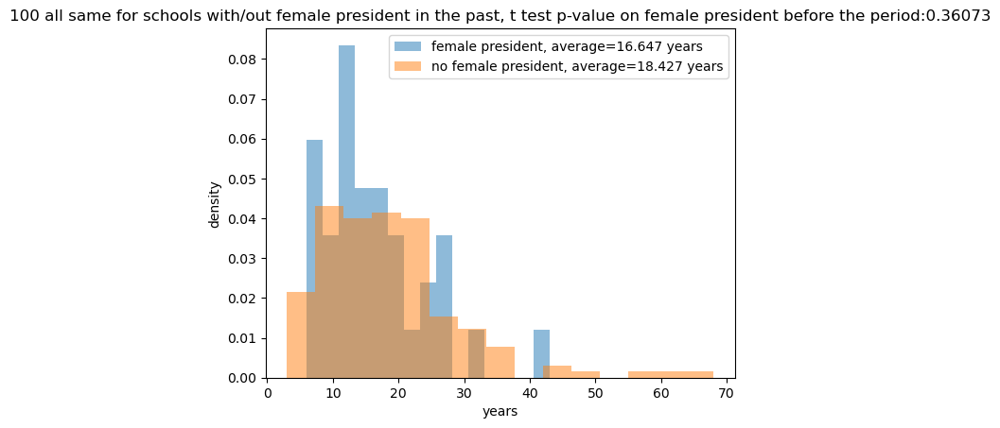

one way anova on REGION : F_onewayResult(statistic=0.48856954965601257, pvalue=0.8420597209947924)
one way anova on LOCALE : F_onewayResult(statistic=1.2276221191180208, pvalue=0.2854096164330852)
one way anova on CCUGPROF : F_onewayResult(statistic=3.7767348294842593, pvalue=0.00022792936183955198)
one way anova on CCSIZSET : F_onewayResult(statistic=1.673424386860807, pvalue=0.1299925609084671)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:           100 all same   R-squared:                       0.062
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     4.232
Date:                Thu, 02 Nov 2023   Prob (F-statistic):             0.0437
Time:                        16:03:54   Log-Likelihood:                -249.71
No. Observations:                  66   AIC:                             503.4
Df

******** regression on all variables and no controls, no interaction ********

                            OLS Regression Results                            
Dep. Variable:           100 all same   R-squared:                       0.267
Model:                            OLS   Adj. R-squared:                  0.251
Method:                 Least Squares   F-statistic:                     16.33
Date:                Thu, 02 Nov 2023   Prob (F-statistic):           2.01e-11
Time:                        16:03:54   Log-Likelihood:                -659.65
No. Observations:                 184   AIC:                             1329.
Df Residuals:                     179   BIC:                             1345.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-1.531499,0.130816
1,REGION,5,8,-0.750898,0.455510
2,REGION,5,7,-0.387254,0.700119
3,REGION,5,2,-0.765871,0.446157
4,REGION,5,3,0.020896,0.983388
5,REGION,5,4,-0.079345,0.937032
6,REGION,5,1,-0.128331,0.898373
7,REGION,6,8,0.754704,0.455079
8,REGION,6,7,0.592537,0.558246
9,REGION,6,2,0.777223,0.440689


In [33]:
var_name = '100 all same'
disp_result(var_name)

p-value for t test against 0:0.0
matched t test p-value on ccbasic:2e-05


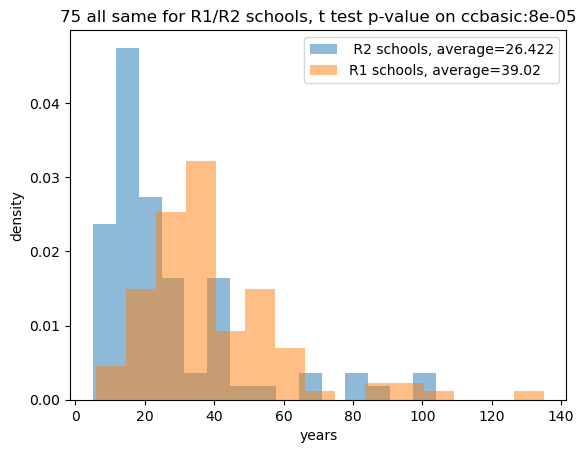

matched t test p-value on control:0.95911


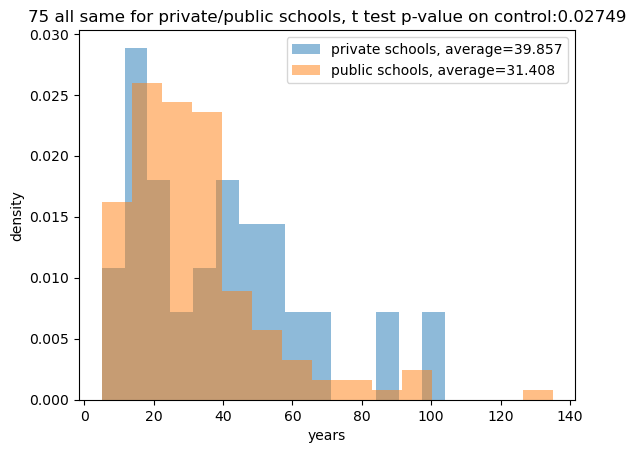

matched t test p-value on control:0.29732


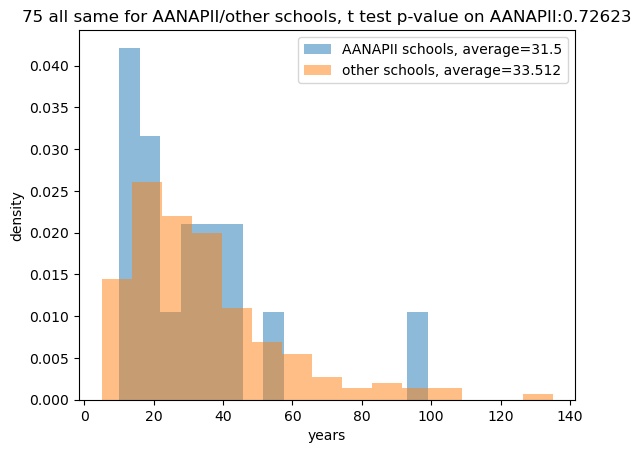

matched t test p-value on control:0.17904


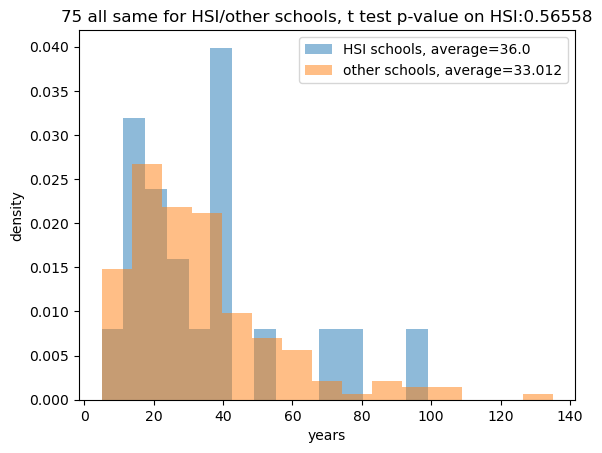

matched t test p-value on women president 2012-2019:0.06367


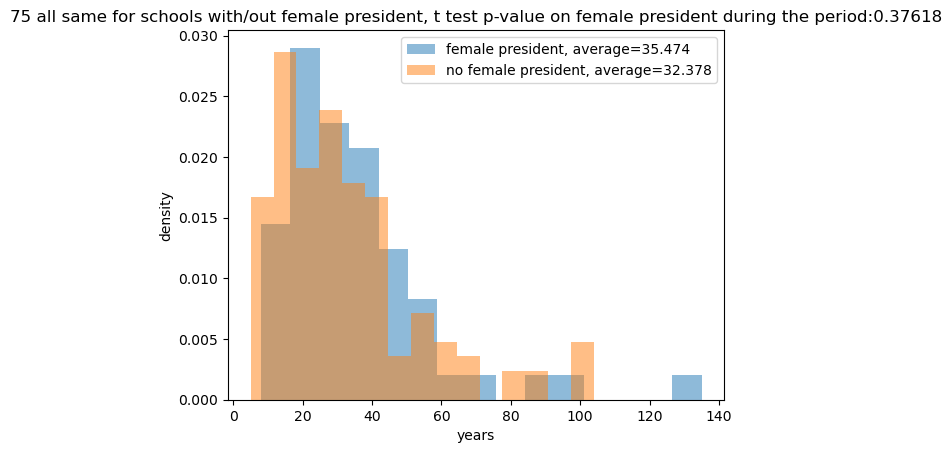

matched t test p-value on women president before 2012:0.0406


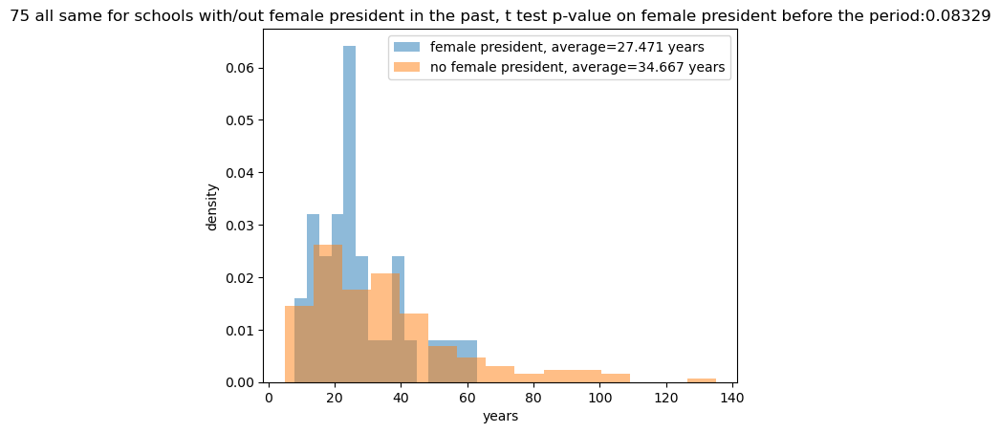

one way anova on REGION : F_onewayResult(statistic=1.316668210442714, pvalue=0.24485577655120097)
one way anova on LOCALE : F_onewayResult(statistic=0.5733306158693358, pvalue=0.7988738812176415)
one way anova on CCUGPROF : F_onewayResult(statistic=2.1807406135635503, pvalue=0.025489274468298122)
one way anova on CCSIZSET : F_onewayResult(statistic=1.3537842203429988, pvalue=0.2358477068365586)
******** regression solely on rank ********

                            OLS Regression Results                            
Dep. Variable:            75 all same   R-squared:                       0.028
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     1.852
Date:                Thu, 02 Nov 2023   Prob (F-statistic):              0.178
Time:                        16:03:55   Log-Likelihood:                -296.73
No. Observations:                  66   AIC:                             597.5
Df R

******** regression on all variables and no controls, no interaction ********

                            OLS Regression Results                            
Dep. Variable:            75 all same   R-squared:                       0.165
Model:                            OLS   Adj. R-squared:                  0.147
Method:                 Least Squares   F-statistic:                     8.853
Date:                Thu, 02 Nov 2023   Prob (F-statistic):           1.52e-06
Time:                        16:03:55   Log-Likelihood:                -811.68
No. Observations:                 184   AIC:                             1633.
Df Residuals:                     179   BIC:                             1649.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

,group by var,categ1,categ2,tstat,pvalue
0,REGION,5,6,-2.352140,0.021909
1,REGION,5,8,-0.323949,0.747050
2,REGION,5,7,-0.074357,0.941007
3,REGION,5,2,-1.442079,0.153443
4,REGION,5,3,0.031962,0.974592
5,REGION,5,4,0.101617,0.919411
6,REGION,5,1,-0.738616,0.463399
7,REGION,6,8,1.703662,0.096610
8,REGION,6,7,1.280638,0.210828
9,REGION,6,2,0.889400,0.378047


In [34]:
var_name = '75 all same'
disp_result(var_name)